# Coursework 2 Group (5)

Complete the following information

Group number: 5

Student names and k-numbers:
1. Henry Olumide Longe K2552174
2. Nsetu Tarimo K2604076
3. Raghav Sharma K2538534
4. Thaw Zin Lin Myat K2543493

# Load modules 

In [1]:
#basic data analysis libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import Image, display
from medmnist import OrganSMNIST
import os

#Tensorflow libraries
import tensorflow as tf
from tensorflow.keras.utils import plot_model
from tensorflow.keras import Sequential, Input
from tensorflow.keras.layers import Dropout, Dense, BatchNormalization, Activation, Flatten, Conv2D, MaxPooling2D, GlobalAveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input as mobilenet_preprocess
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet_preprocess
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.models import Model

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score,balanced_accuracy_score, confusion_matrix, roc_auc_score, roc_curve
from sklearn.preprocessing import label_binarize

#plotting libraries
import plotly.io as pio
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
pio.renderers.default = "png"

I0000 00:00:1776088258.855737    2784 port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
I0000 00:00:1776088259.307246    2784 cpu_feature_guard.cc:227] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
I0000 00:00:1776088261.131776    2784 port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


# Load Data

In [2]:
tf.random.set_seed(42)

In [3]:
print(tf.config.list_physical_devices('GPU'))

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


W0000 00:00:1776088261.951514    2784 gpu_device.cc:2459] TensorFlow was not built with CUDA kernel binaries compatible with compute capability 12.0a. CUDA kernels will be jit-compiled from PTX, which could take 30 minutes or longer.


In [4]:
#Getting data
train_dataset = OrganSMNIST(split="train", download=True, size=224)
val_dataset   = OrganSMNIST(split="val", download=True, size=224)
test_dataset  = OrganSMNIST(split="test", download=True, size=224)

#putting them in X and y
X_train_raw, y_train_raw = train_dataset.imgs, train_dataset.labels
X_val_raw , y_val_raw      = val_dataset.imgs, val_dataset.labels
X_test_raw , y_test_raw    = test_dataset.imgs, test_dataset.labels

In [5]:
print(f"Training - Image Shape: {X_train_raw.shape} Label Shape: {y_train_raw.shape}")
print(f"Validation - Image Shape: {X_val_raw.shape} Label Shape: {y_val_raw.shape}")
print(f"Testing - Image Shape: {X_test_raw.shape} Label Shape: {y_test_raw.shape}\n\n")

Training - Image Shape: (13932, 224, 224) Label Shape: (13932, 1)
Validation - Image Shape: (2452, 224, 224) Label Shape: (2452, 1)
Testing - Image Shape: (8827, 224, 224) Label Shape: (8827, 1)




In [6]:
# Class Labels
class_label_list = ['bladder', 'femur-left', 'femur-right', 'heart', 'kidney-left', 'kidney-right', 'liver', 'lung-left', 'lung-right',
                  'pancreas', 'spleen']

# Initial Visualisation

Display first image of each of the Organs in the dataset

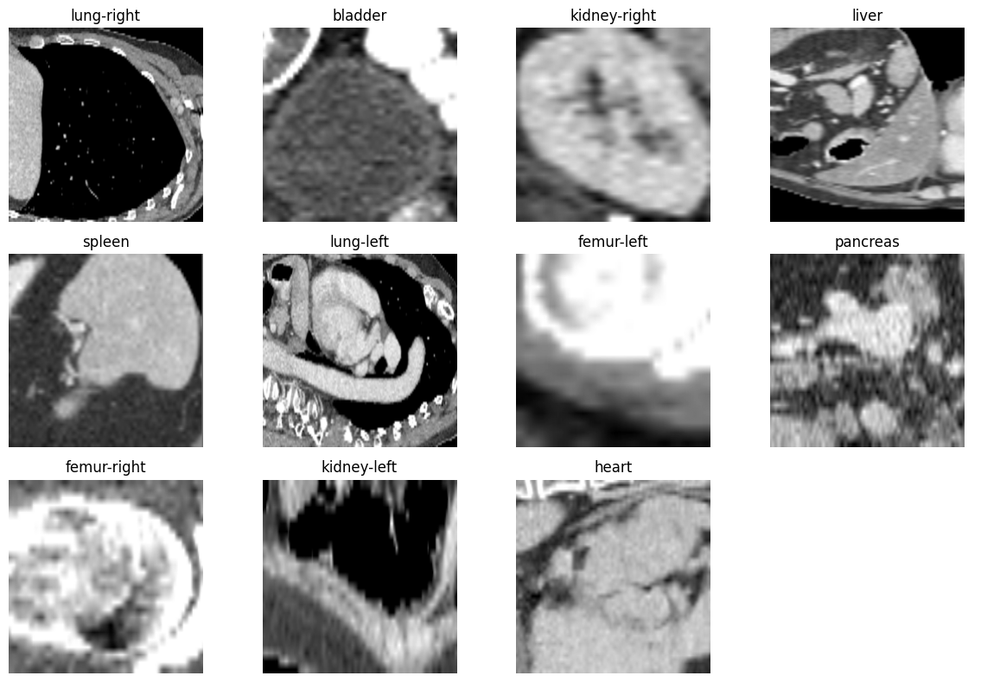

In [7]:
num_classes = len(class_label_list)

labels = y_train_raw.flatten()

# Get the index of each class
seen_classes = set()
selected_indices = []
for i in range(len(train_dataset)):
    label_idx = int(train_dataset[i][1][0])

    if label_idx not in seen_classes:
        seen_classes.add(label_idx)
        selected_indices.append(i)

    if len(seen_classes) == num_classes:
        break

# Plot
fig, axes = plt.subplots(3, 4, figsize=(12,8))
axes = axes.flat

for i, idx in enumerate(selected_indices):
    ax = axes[i]
    ax.imshow(X_train_raw[idx].squeeze(), cmap='gray')
    ax.set_title(class_label_list[labels[idx]])
    ax.axis('off')
for j in range(num_classes, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

Random 5 Image for each class

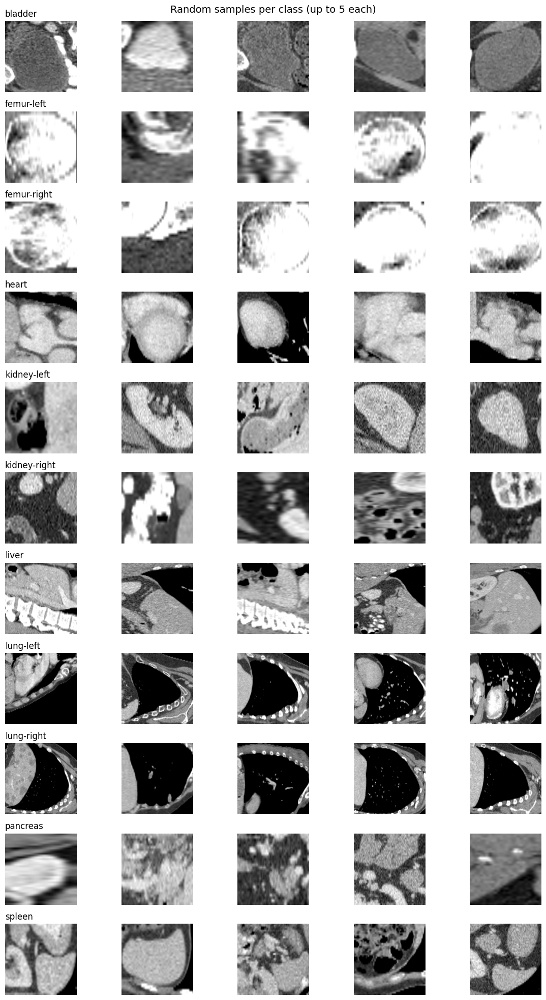

In [8]:
np.random.seed(0)

fig, axes = plt.subplots(num_classes, 5, figsize=(12, 20))
plt.suptitle("Random samples per class (up to 5 each)", fontsize=14)
for class_idx in range(num_classes):
    class_indices = np.where(labels == class_idx)[0]
    
    selected = np.random.choice(class_indices, 5, replace=False)    
    for j, idx in enumerate(selected):
        ax = axes[class_idx, j]
        ax.imshow(X_train_raw[idx].squeeze(), cmap='gray')        
        if j == 0:
            ax.set_title(class_label_list[class_idx], loc='left')
        ax.axis('off')

plt.tight_layout()
plt.show()

In [9]:
def displayDatasetDistribution(dataset_name, dataset):

    class_label_dict = {}
    
    class_index, class_count = np.unique(dataset.labels, return_counts=True)
    #Display data in Text
    if 'train' in dataset_name.lower():
        dataset_name = 'Training'
        print(f"\n\nThe number of observations or samples in the Training Dataset is: {len(dataset)}\n\n")
    elif 'val' in dataset_name.lower():
        dataset_name = 'Validation'
        print(f"\n\nThe number of observations or samples in the {dataset_name} Dataset is: {len(dataset)}\n")
    elif 'test' in dataset_name.lower():
        dataset_name = 'Testing'
        print(f"\n\nThe number of observations or samples in the {dataset_name} Dataset is: {len(dataset)}\n")
    else:
        pass
    print(f"ORGAN COUNT:")
    for index, count in zip(class_index, class_count):
        print(f"{index+1}. Organ Name: {class_label_list[index].upper()}   Organ Count: {count}\n")
        class_label_dict[class_label_list[index]] = count.astype("int32")

    #Building for plotly
    labels = list(class_label_dict.keys())
    values = list(class_label_dict.values())

    base_colors = colors = px.colors.qualitative.Set3
    color_map = {label: base_colors[i] for i, label in enumerate(labels)}
    mapped_colors = [color_map[label] for label in labels]

    # Bar Chart
    fig = go.Figure(data=[
    go.Bar(
        x=labels,
        y=values,
        marker=dict(color=colors)
        )
    ])
    fig.update_layout(
        title=f"{dataset_name} Dataset Distribution",
        xaxis_title="Organs",
        yaxis_title="Count",
        width=800,
        height=600
    )
    fig.show()

    # Pie Chart
    fig = go.Figure(data=[
    go.Pie(
        labels=labels,
        values=values,
        textinfo='percent+label',
        marker=dict(colors=colors)
    )
    ])
    fig.update_layout(
        title=f"Pie Chart of {dataset_name} Dataset Distribution",
        # template="plotly_white",
        width=800,
        height=600
    )
    fig.show()





The number of observations or samples in the Training Dataset is: 13932


ORGAN COUNT:
1. Organ Name: BLADDER   Organ Count: 1148

2. Organ Name: FEMUR-LEFT   Organ Count: 630

3. Organ Name: FEMUR-RIGHT   Organ Count: 614

4. Organ Name: HEART   Organ Count: 721

5. Organ Name: KIDNEY-LEFT   Organ Count: 1132

6. Organ Name: KIDNEY-RIGHT   Organ Count: 1119

7. Organ Name: LIVER   Organ Count: 3464

8. Organ Name: LUNG-LEFT   Organ Count: 741

9. Organ Name: LUNG-RIGHT   Organ Count: 803

10. Organ Name: PANCREAS   Organ Count: 2004

11. Organ Name: SPLEEN   Organ Count: 1556



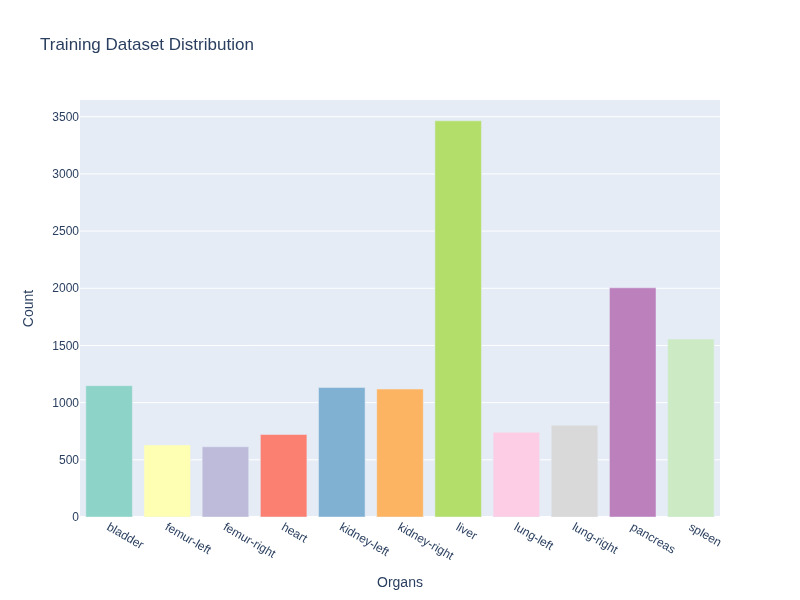

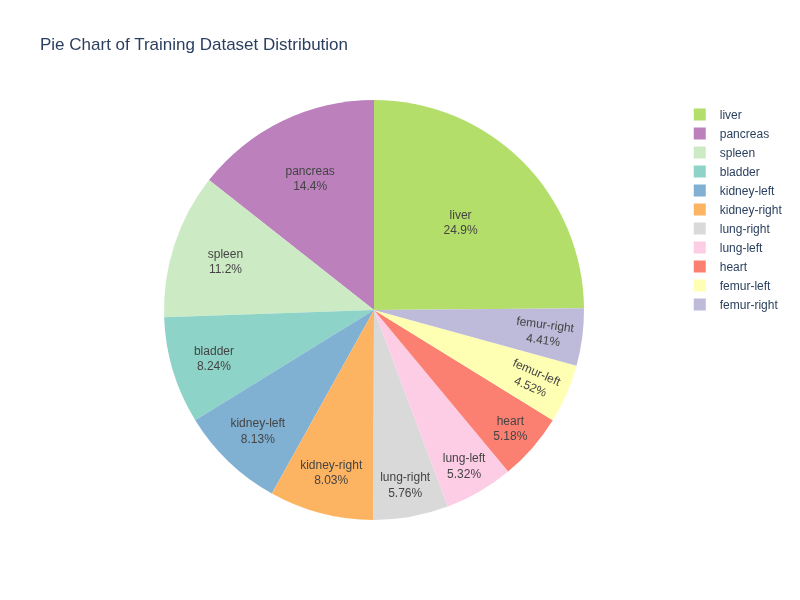

In [10]:
displayDatasetDistribution('train', train_dataset)



The number of observations or samples in the Validation Dataset is: 2452

ORGAN COUNT:
1. Organ Name: BLADDER   Organ Count: 188

2. Organ Name: FEMUR-LEFT   Organ Count: 104

3. Organ Name: FEMUR-RIGHT   Organ Count: 95

4. Organ Name: HEART   Organ Count: 246

5. Organ Name: KIDNEY-LEFT   Organ Count: 140

6. Organ Name: KIDNEY-RIGHT   Organ Count: 159

7. Organ Name: LIVER   Organ Count: 491

8. Organ Name: LUNG-LEFT   Organ Count: 261

9. Organ Name: LUNG-RIGHT   Organ Count: 275

10. Organ Name: PANCREAS   Organ Count: 280

11. Organ Name: SPLEEN   Organ Count: 213



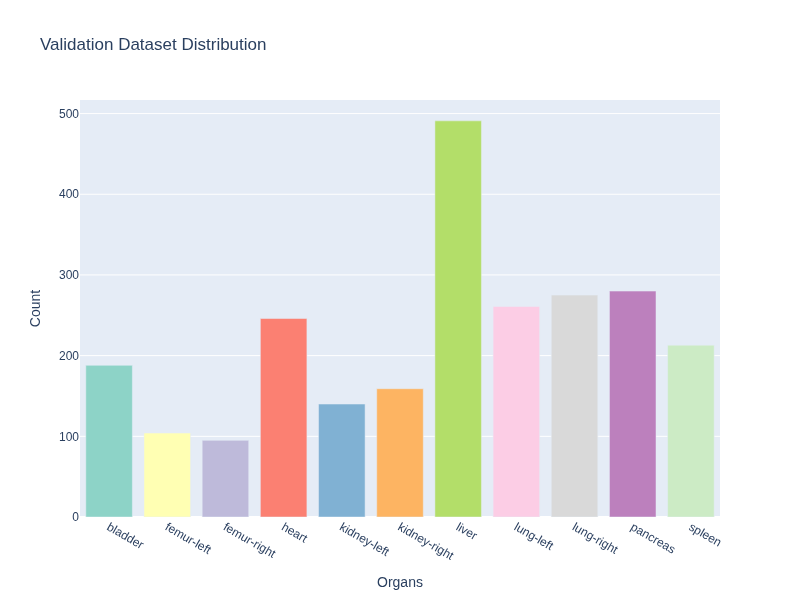

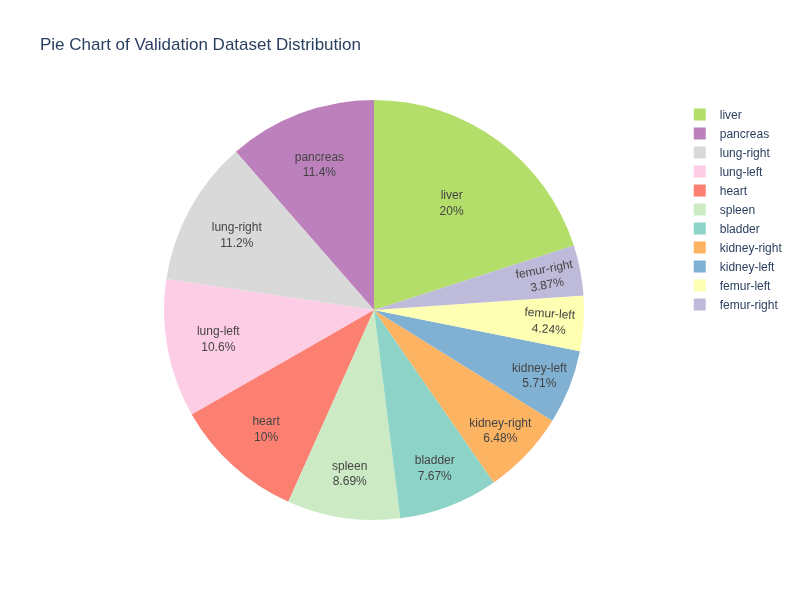

In [11]:
displayDatasetDistribution('val', val_dataset)



The number of observations or samples in the Testing Dataset is: 8827

ORGAN COUNT:
1. Organ Name: BLADDER   Organ Count: 811

2. Organ Name: FEMUR-LEFT   Organ Count: 439

3. Organ Name: FEMUR-RIGHT   Organ Count: 445

4. Organ Name: HEART   Organ Count: 510

5. Organ Name: KIDNEY-LEFT   Organ Count: 704

6. Organ Name: KIDNEY-RIGHT   Organ Count: 693

7. Organ Name: LIVER   Organ Count: 2078

8. Organ Name: LUNG-LEFT   Organ Count: 397

9. Organ Name: LUNG-RIGHT   Organ Count: 439

10. Organ Name: PANCREAS   Organ Count: 1343

11. Organ Name: SPLEEN   Organ Count: 968



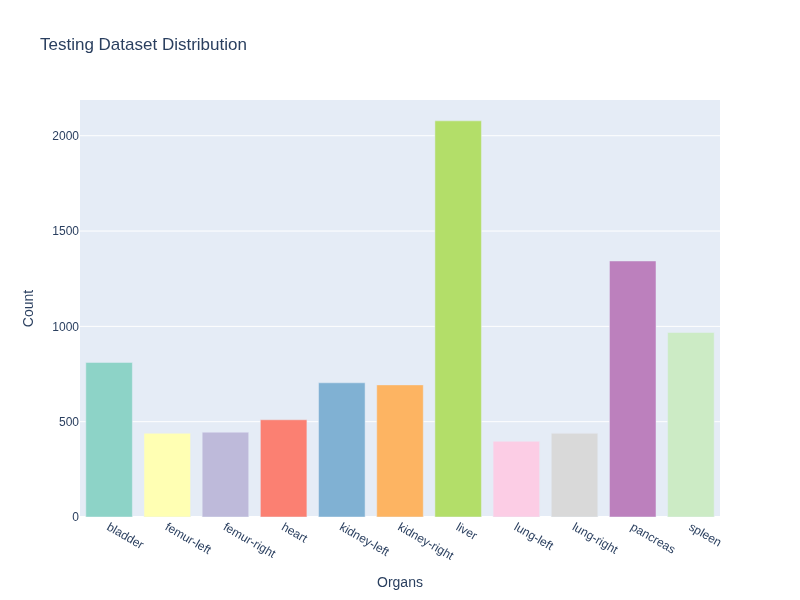

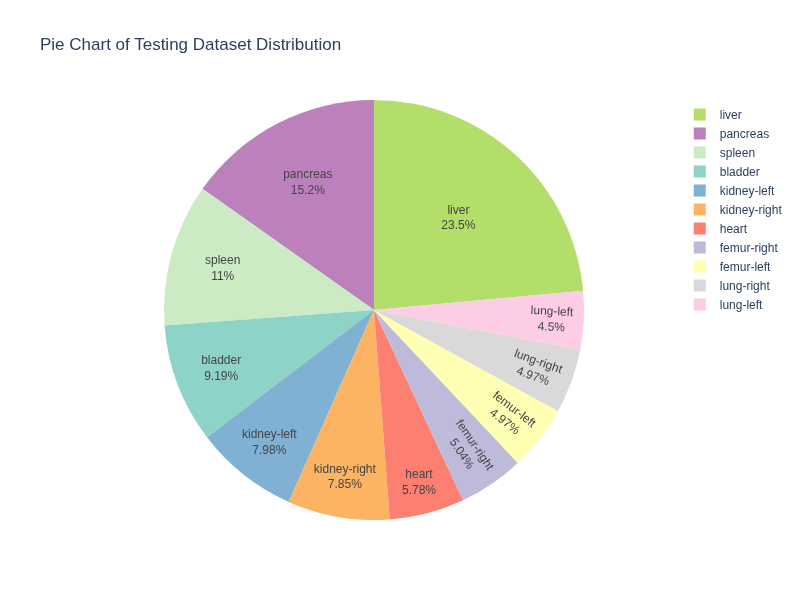

In [12]:
displayDatasetDistribution('test', test_dataset)

### Dataset Summary

The Dataset is imbalanced as shown from the above visualizations and metrics.

# Preprocessing

In [13]:
# Normalise
X_train = X_train_raw / 255.0
X_val  = X_val_raw / 255.0
X_test  = X_test_raw / 255.0

In [14]:
print(X_train.shape)

(13932, 224, 224)


In [15]:
X_train = X_train[..., np.newaxis]
X_val   = X_val[..., np.newaxis]
X_test  = X_test[..., np.newaxis]

In [16]:
y_train = y_train_raw.squeeze()
y_val   = y_val_raw.squeeze()
y_test  = y_test_raw.squeeze()

In [17]:
input_shape = X_train.shape[1:]
num_classes = len(np.unique(y_train))

print("Input Shape: ",input_shape,"\nNumber of Classes: ",num_classes)

Input Shape:  (224, 224, 1) 
Number of Classes:  11


In [18]:
print(X_train.shape, y_train.shape)

(13932, 224, 224, 1) (13932,)


Early stop and reduce learning rate function will be implemented in every models. 

In [19]:
#copied from cifar10-full canvas
early_stop_loss_Demo = EarlyStopping(
    monitor='val_loss',          # metric to watch
    patience=5,                # epochs to wait after last improvement
    restore_best_weights=True   # go back to best model
)
reduce_lr_Demo = ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.5,
    patience=3,
    min_lr=1e-5,
    verbose=1
)

In [20]:
datagen_Demo = ImageDataGenerator(
    rotation_range=15,        # rotate images ±15 degrees
    width_shift_range=0.1,    # shift horizontally ±10%
    height_shift_range=0.1,   # shift vertically ±10%
    horizontal_flip=True,     # randomly flip images
    zoom_range=0.1            # random zoom
)

## Preparing Helper Functions for future Visualisation

In [21]:
def plot_history(history, model_name='model'):
    epochs = list(range(1, len(history.history['val_loss']) + 1))
    best_epoch = int(np.argmin(history.history['val_loss']) + 1)

    fig = make_subplots(
        rows=1, cols=2,
        subplot_titles=(f"{model_name} — Loss", f"{model_name} — Accuracy")
    )

    # loss 
    fig.add_trace(
        go.Scatter(x=epochs, y=history.history['loss'], mode='lines', name='Train Loss'),
        row=1, col=1
    )
    fig.add_trace(
        go.Scatter(x=epochs, y=history.history['val_loss'], mode='lines', name='Validation Loss'),
        row=1, col=1
    )

    # best epoch line (Loss)
    fig.add_vline(
        x=best_epoch, line_dash="dash",
        annotation_text=f"Best Epoch = {best_epoch}",
        annotation_xshift=10,
        row=1, col=1
    )

    # accuracy
    fig.add_trace(
        go.Scatter(x=epochs, y=history.history['accuracy'], mode='lines', name='Train Accuracy'),
        row=1, col=2
    )
    fig.add_trace(
        go.Scatter(x=epochs, y=history.history['val_accuracy'], mode='lines', name='Validation Accuracy'),
        row=1, col=2
    )

    # best epoch line (Accuracy)
    fig.add_vline(
        x=best_epoch, line_dash="dash",
        annotation_text=f"Best Epoch = {best_epoch}",
        annotation_xshift=10,
        row=1, col=2
    )
    fig.update_yaxes(
        title_text="Loss",
        dtick=0.4, 
        row=1, col=1
    )
    fig.update_yaxes(
        title_text="Loss",
        dtick=0.1, 
        row=1, col=2
    )

    fig.update_layout(
        title=f"{model_name} Training History",
        height=480,
        width=1400
    )
    fig.update_xaxes(title_text="Epoch", row=1, col=1)
    fig.update_yaxes(title_text="Loss", row=1, col=1)

    fig.update_xaxes(title_text="Epoch", row=1, col=2)
    fig.update_yaxes(title_text="Accuracy", row=1, col=2)

    fig.show() 

In [22]:
def plot_archi(models):
    for name, model in models.items():
        temp_file = f"images/{name}_temp.png"
        plot_model(
            model,
            to_file=temp_file,
            show_shapes=True,
            show_layer_names=True,
            show_trainable=True,
            dpi=100
        )
        print(f"{name}:")
        display(Image(filename=temp_file))
        #remove temp
        os.remove(temp_file)

In [23]:
def plot_summ(models):
    for name, model in models.items():
        print(f"\n{name}:")
        model.summary(show_trainable=True)

In [24]:
#Fitting Classification --- This is for Finding out is the model is overfit or underfit or good fit 
# Current high accuracy threshold is set to .80 and gap is to 0.05 and 0.1 for loss
def fit_group(train_acc, val_acc, train_loss, val_loss):
    acc_gap  = train_acc - val_acc
    loss_gap = val_loss - train_loss

    HIGH_ACC = 0.80
    GAP_ACC  = 0.05
    GAP_LOSS = 0.1

    if train_acc < HIGH_ACC and val_acc < HIGH_ACC:
        return "Underfitting"
    elif acc_gap > GAP_ACC and loss_gap > GAP_LOSS:
        return "Overfitting"
    else:
        return "Good fit"

In [25]:
def highlight_fit(val):
    if val == "Overfitting":
        return "color: red"
    elif val == "Underfitting":
        return "color: yellow"
    elif val == "Good fit":
        return "color: green"
    return ""

In [26]:
def highlight_best(col):
    max_val = col.max()
    return ['font-weight: bold; color: green; text-decoration: underline' if v == max_val else '' for v in col]

# Q1

## NN Models

### Baseline NN

#### Model and Architecture

In [27]:
#model nn 1 --- baseline nn
model_nn_1 = Sequential([
    Input(shape=(224, 224, 1)),
    Flatten(),
    Dense(100, activation='relu'),
    Dense(11, activation='softmax')
])

W0000 00:00:1776088292.711429    2784 gpu_device.cc:2459] TensorFlow was not built with CUDA kernel binaries compatible with compute capability 12.0a. CUDA kernels will be jit-compiled from PTX, which could take 30 minutes or longer.
I0000 00:00:1776088292.907172    2784 gpu_device.cc:2043] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 9218 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 5070, pci bus id: 0000:01:00.0, compute capability: 12.0a


Plotting Baseline NN Model's Architecture: 


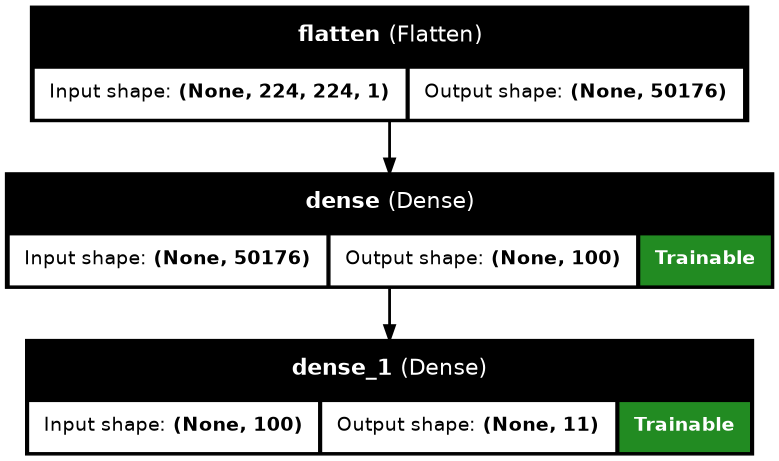

In [28]:
print("Plotting Baseline NN Model's Architecture: ")
plot_model(model_nn_1, show_shapes=True, dpi=100, show_layer_names=True, show_trainable=True)

In [29]:
print("Displaying Baseline NN Model's Summary:")
model_nn_1.summary(show_trainable=True,)

Displaying Baseline NN Model's Summary:


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ flatten (Flatten)           │ (None, 50176)         │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dense (Dense)               │ (None, 100)           │  5,017,700 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dense_1 (Dense)             │ (None, 11)            │      1,111 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 5,018,811 (19.15 MB)

 Trainable params: 5,018,811 (19.15 MB)

 Non-trainable params: 0 (0.00 B)

#### Model Training

In [30]:
early_stop_loss = EarlyStopping(
    monitor='val_loss',          
    patience=5,               
    restore_best_weights=True 
)
reduce_lr = ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.5,
    patience=3,
    min_lr=1e-5,
    verbose=1
)
model_nn_1.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

history_nn_1 = model_nn_1.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=25,
    batch_size=32,
    callbacks=[early_stop_loss, reduce_lr]
)

Epoch 1/25


I0000 00:00:1776088307.073130    4002 service.cc:153] XLA service 0x7785e0030240 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1776088307.073298    4002 service.cc:161]   StreamExecutor [0]: NVIDIA GeForce RTX 5070, Compute Capability 12.0a (Driver: 13.2.0; Runtime: 13.0.0; Toolkit: 12.5.0; DNN: 9.19.0)
I0000 00:00:1776088307.137860    4002 dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1776088307.316141    4002 cuda_dnn.cc:461] Loaded cuDNN version 91900
I0000 00:00:1776088307.336995    4002 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_956__.12
I0000 00:00:1776088309.471036    4100 subprocess_compilation.cc:348] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_MatMul_8', 8 bytes spill stores, 8 bytes spill loads



 33/436 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.1872 - loss: 19.6795

I0000 00:00:1776088311.531047    4002 device_compiler.h:208] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


429/436 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2978 - loss: 5.6126

I0000 00:00:1776088313.687327    4002 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_956__.12


436/436 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.2984 - loss: 5.5679

I0000 00:00:1776088325.624277    4350 subprocess_compilation.cc:348] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_MatMul_4', 8 bytes spill stores, 8 bytes spill loads



436/436 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - accuracy: 0.3384 - loss: 2.8227 - val_accuracy: 0.3927 - val_loss: 1.7248 - learning_rate: 0.0010
Epoch 2/25
436/436 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.3915 - loss: 1.8187 - val_accuracy: 0.3952 - val_loss: 1.7703 - learning_rate: 0.0010
Epoch 3/25
436/436 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.3934 - loss: 1.7656 - val_accuracy: 0.4074 - val_loss: 1.6021 - learning_rate: 0.0010
Epoch 4/25
436/436 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.4120 - loss: 1.6902 - val_accuracy: 0.4021 - val_loss: 1.6752 - learning_rate: 0.0010
Epoch 5/25
436/436 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.4139 - loss: 1.6673 - val_accuracy: 0.3927 - val_loss: 1.6787 - learning_rate: 0.0010
Epoch 6/25
426/436 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4201 - loss: 1.6458
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
436/436 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.4197 - loss: 1.6432 - val_accura

#### Model Results

In [31]:
results_baseline_nn = []

history = history_nn_1

best_epoch = int(np.argmin(history.history["val_loss"]))

train_acc  = history.history["accuracy"][best_epoch]
val_acc    = history.history["val_accuracy"][best_epoch]
train_loss = history.history["loss"][best_epoch]
val_loss   = history.history["val_loss"][best_epoch]

acc_gap  = train_acc - val_acc
loss_gap = val_loss - train_loss

fit_type = fit_group(train_acc, val_acc, train_loss, val_loss)

results_baseline_nn.append({
    "No": 1,
    "Model": "model_nn_1",
    "Type": "Baseline (1 hidden layer, 100 neurons)",
    
    "Best Epoch": best_epoch + 1,

    "Train Acc": train_acc,
    "Val Acc": val_acc,
    "Train Loss": train_loss,
    "Val Loss": val_loss,

    "Fit": fit_type,
    "Acc Gap": acc_gap,
    "Loss Gap": loss_gap
})

In [32]:
df_baseline_nn = pd.DataFrame(results_baseline_nn)
df_baseline_nn = df_baseline_nn.style.format({
    col: "{:.4f}" for col in df_baseline_nn.select_dtypes(include="number").columns
}).map(highlight_fit, subset=["Fit"])
df_baseline_nn

,No,Model,Type,Best Epoch,Train Acc,Val Acc,Train Loss,Val Loss,Fit,Acc Gap,Loss Gap
0,1.0000,model_nn_1,"Baseline (1 hidden layer, 100 neurons)",3.0000,0.3934,0.4074,1.7656,1.6021,Underfitting,-0.0140,-0.1635


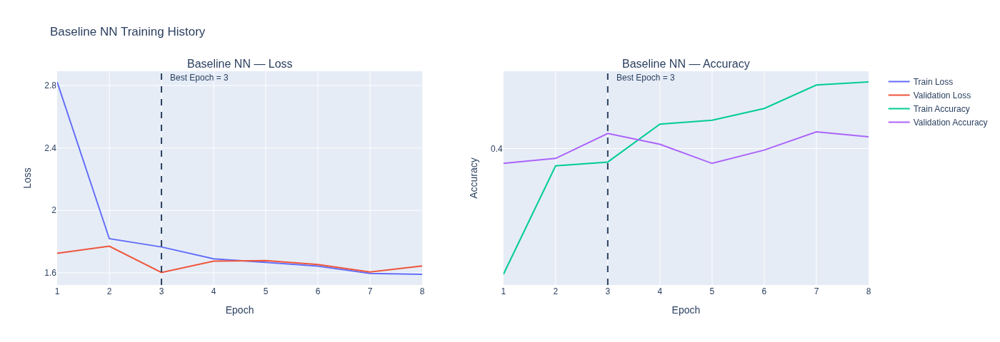

In [33]:
plot_history(history_nn_1, 'Baseline NN')

# Q2

## NN Models

### Modified NN Models

#### Model and Architecture

In [34]:
#model nn t1-t5 --- modified nn
def build_nn_model(config, input_shape, num_classes):
    model = Sequential()
    model.add(Input(shape=input_shape))
    model.add(Flatten())

    for units in config["layers"]:
        model.add(Dense(units, activation='relu'))

        # Batch Normalization
        if config.get("batchnorm"):
            model.add(BatchNormalization())

        # Dropout
        if config.get("dropout"):
            model.add(Dropout(config["dropout"]))

    model.add(Dense(num_classes, activation='softmax'))

    model.compile(
        optimizer='adam',
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

configs_nn = [
    {"name": "Deeper", "layers": [256, 128]},  

    {"name": "Wider", "layers": [512, 256, 128]},  

    {"name": "With Dropout", "layers": [256, 128], "dropout": 0.3},  

    {"name": "With Batch Normalised", "layers": [256, 128], "batchnorm": True},  

    {"name": "Dropout + Batch Normalised", "layers": [256, 128], "dropout": 0.3, "batchnorm": True }
]

In [35]:
models_nn = {}

for i, config in enumerate(configs_nn, start=1):
    model_name = f"model_nn_t{i}"
    model = build_nn_model(config, input_shape, num_classes)
    models_nn[model_name] = model

Plotting NN Models' Architecture: 
model_nn_t1:


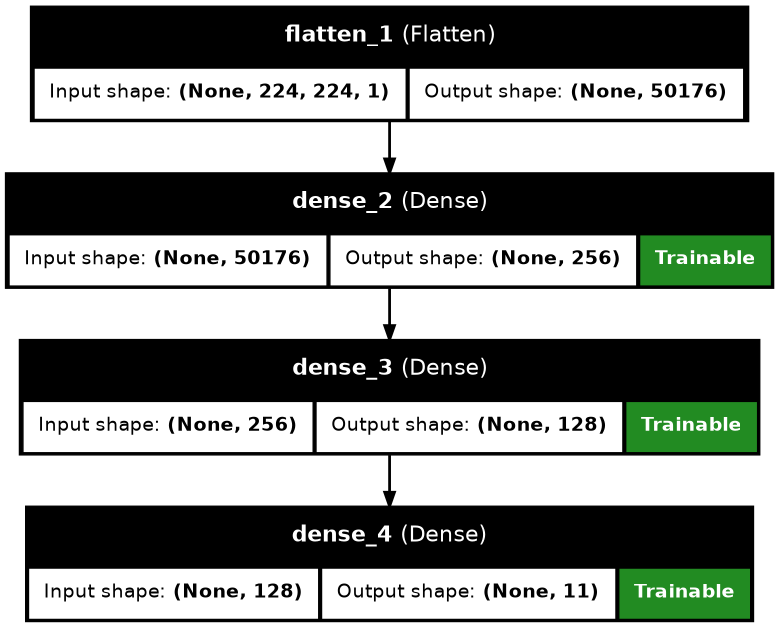

model_nn_t2:


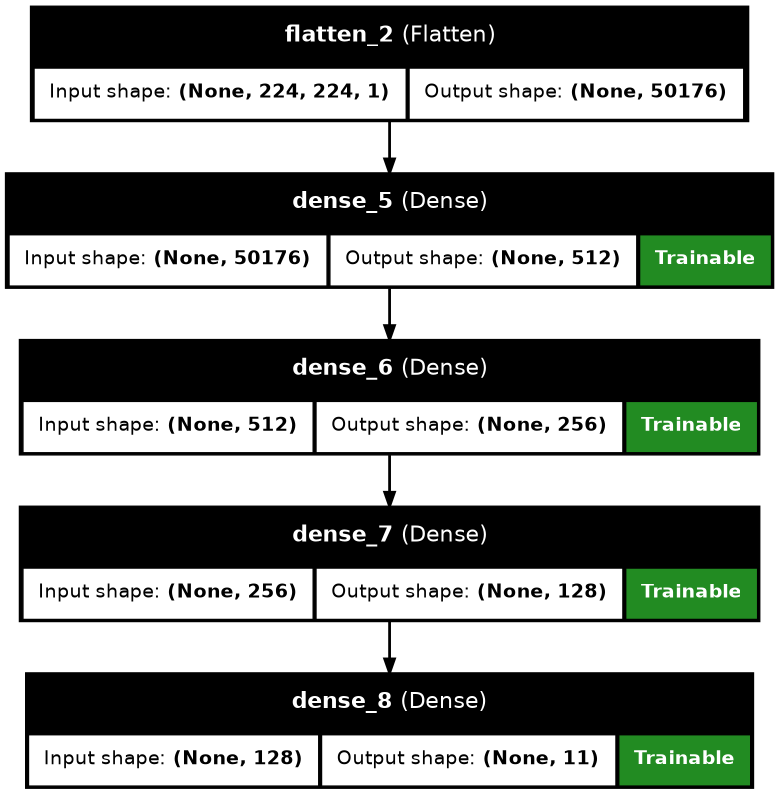

model_nn_t3:


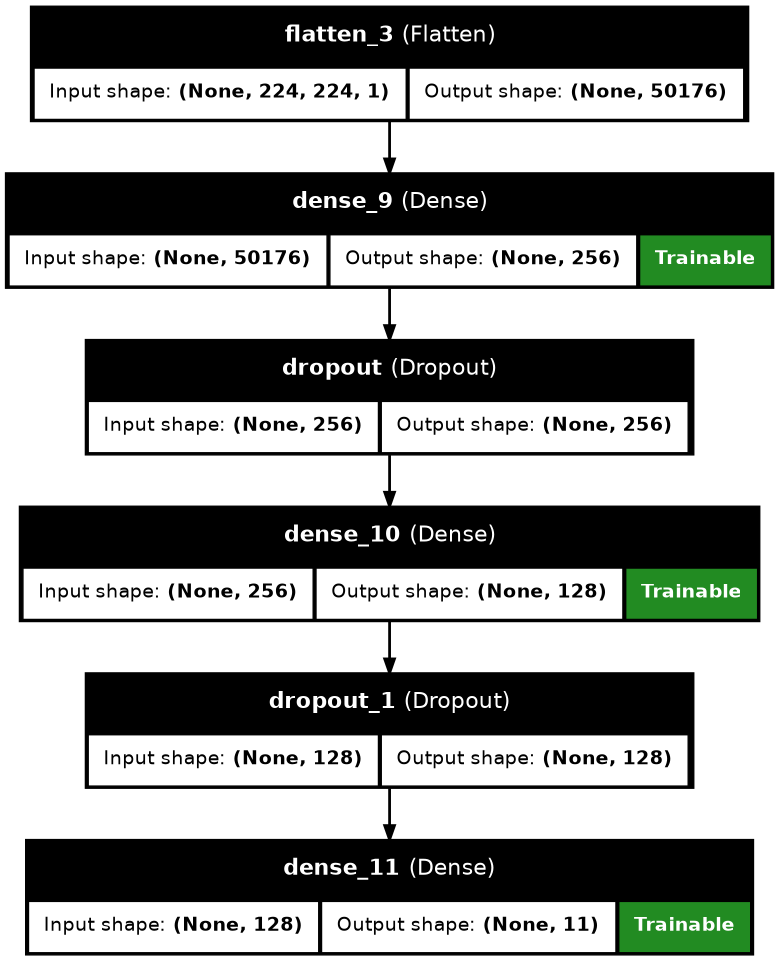

model_nn_t4:


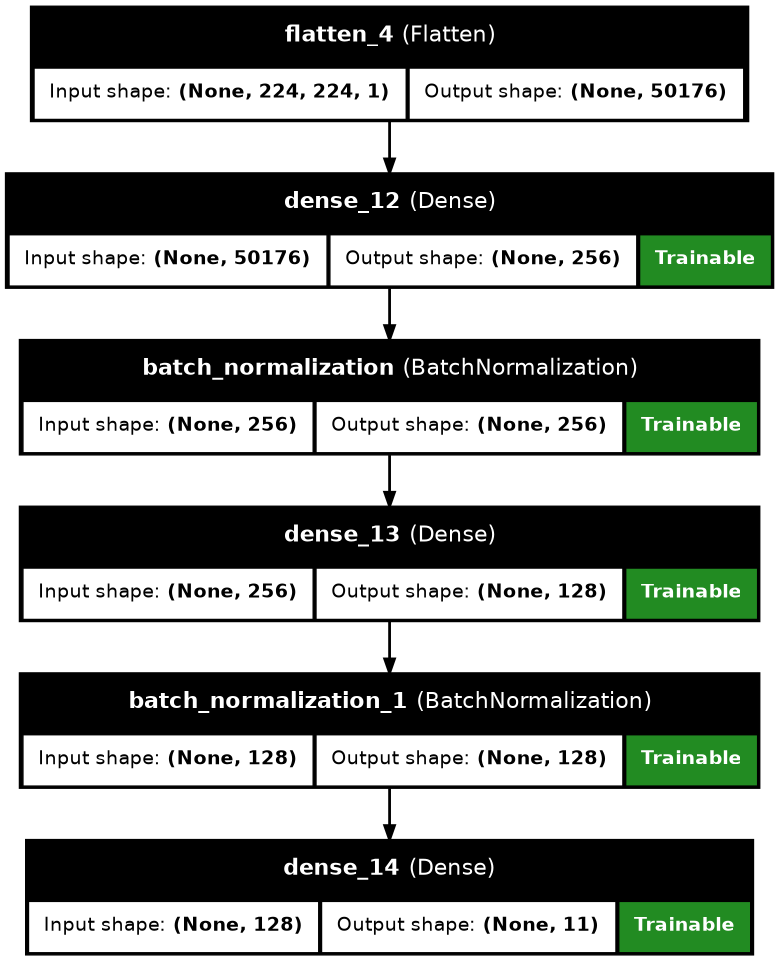

model_nn_t5:


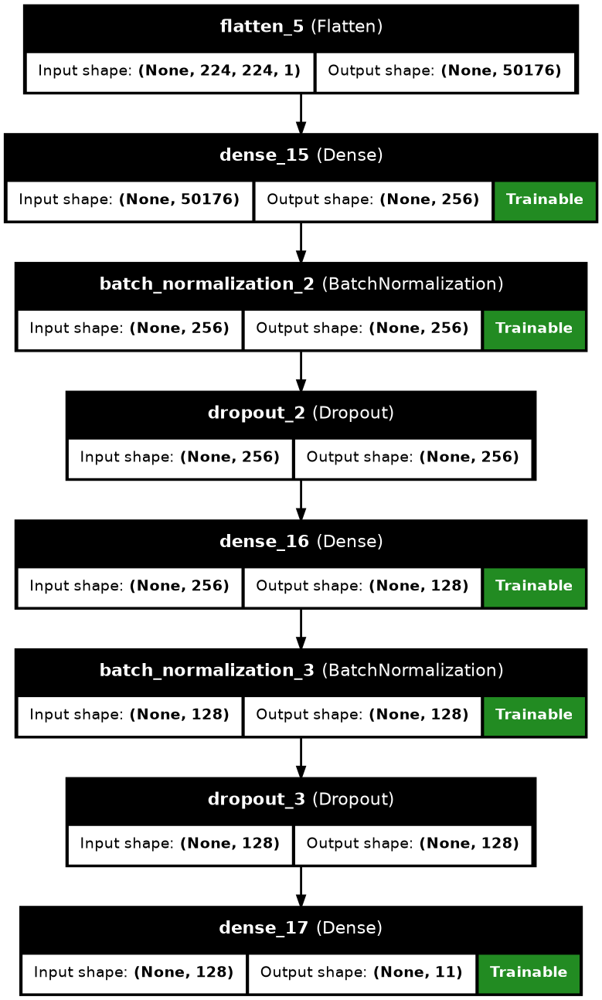

In [36]:
print("Plotting NN Models' Architecture: ")
plot_archi(models_nn)

In [37]:
print("Displaying NN Models' Summary:")
plot_summ(models_nn)

Displaying NN Models' Summary:

model_nn_t1:


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ flatten_1 (Flatten)         │ (None, 50176)         │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dense_2 (Dense)             │ (None, 256)           │ 12,845,312 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dense_3 (Dense)             │ (None, 128)           │     32,896 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dense_4 (Dense)             │ (None, 11)            │      1,419 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 12,879,627 (49.13 MB)

 Trainable params: 12,879,627 (49.13 MB)

 Non-trainable params: 0 (0.00 B)


model_nn_t2:


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ flatten_2 (Flatten)         │ (None, 50176)         │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dense_5 (Dense)             │ (None, 512)           │ 25,690,624 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dense_6 (Dense)             │ (None, 256)           │    131,328 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dense_7 (Dense)             │ (None, 128)           │     32,896 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dense_8 (Dense)             │ (None, 11)            │      1,419 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 25,856,267 (98.63 MB)

 Trainable params: 25,856,267 (98.63 MB)

 Non-trainable params: 0 (0.00 B)


model_nn_t3:


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ flatten_3 (Flatten)         │ (None, 50176)         │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dense_9 (Dense)             │ (None, 256)           │ 12,845,312 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dropout (Dropout)           │ (None, 256)           │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dense_10 (Dense)            │ (None, 128)           │     32,896 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dropout_1 (Dropout)         │ (None, 128)           │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dense_11 (Dense)            │ (None, 11)            │      1,419 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 12,879,627 (49.13 MB)

 Trainable params: 12,879,627 (49.13 MB)

 Non-trainable params: 0 (0.00 B)


model_nn_t4:


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ flatten_4 (Flatten)         │ (None, 50176)         │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dense_12 (Dense)            │ (None, 256)           │ 12,845,312 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ batch_normalization         │ (None, 256)           │      1,024 │   Y   │
│ (BatchNormalization)        │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dense_13 (Dense)            │ (None, 128)           │     32,896 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ batch_normalization_1       │ (None, 128)           │        512 │   Y   │
│ (BatchNormalization)        │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dense_14 (Dense)            │ (None, 11)            │      1,419 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 12,881,163 (49.14 MB)

 Trainable params: 12,880,395 (49.13 MB)

 Non-trainable params: 768 (3.00 KB)


model_nn_t5:


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ flatten_5 (Flatten)         │ (None, 50176)         │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dense_15 (Dense)            │ (None, 256)           │ 12,845,312 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ batch_normalization_2       │ (None, 256)           │      1,024 │   Y   │
│ (BatchNormalization)        │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dropout_2 (Dropout)         │ (None, 256)           │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dense_16 (Dense)            │ (None, 128)           │     32,896 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ batch_normalization_3       │ (None, 128)           │        512 │   Y   │
│ (BatchNormalization)        │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dropout_3 (Dropout)         │ (None, 128)           │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dense_17 (Dense)            │ (None, 11)            │      1,419 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 12,881,163 (49.14 MB)

 Trainable params: 12,880,395 (49.13 MB)

 Non-trainable params: 768 (3.00 KB)

#### Model Training

In [38]:
histories_nn = {}
for i, (model_name, model) in enumerate(models_nn.items()):
    config = configs_nn[i]
    print(f"Training: {model_name} ({config['name']})")

    early_stop_loss = EarlyStopping(
        monitor='val_loss',
        patience=5,
        restore_best_weights=True
    )

    reduce_lr = ReduceLROnPlateau(
        monitor="val_loss",
        factor=0.5,
        patience=3,
        min_lr=1e-5,
        verbose=1
    )

    history = model.fit(
        X_train, y_train,
        validation_data=(X_val, y_val),
        epochs=20,
        batch_size=32,
        callbacks=[early_stop_loss, reduce_lr],
        verbose=1
    )

    histories_nn[model_name] = history
    print("\n")

Training: model_nn_t1 (Deeper)
Epoch 1/20


I0000 00:00:1776088357.637650    4002 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_19583__.13
I0000 00:00:1776088358.764967    4973 subprocess_compilation.cc:348] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_MatMul_12', 8 bytes spill stores, 8 bytes spill loads



430/436 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.3122 - loss: 5.8568

I0000 00:00:1776088363.188086    4001 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_19583__.13
I0000 00:00:1776088364.088901    5093 subprocess_compilation.cc:348] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_MatMul_12', 8 bytes spill stores, 8 bytes spill loads



436/436 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - accuracy: 0.3818 - loss: 2.9747 - val_accuracy: 0.4710 - val_loss: 1.6674 - learning_rate: 0.0010
Epoch 2/20
436/436 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.4794 - loss: 1.5494 - val_accuracy: 0.5918 - val_loss: 1.1934 - learning_rate: 0.0010
Epoch 3/20
436/436 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.5406 - loss: 1.3294 - val_accuracy: 0.6550 - val_loss: 0.9932 - learning_rate: 0.0010
Epoch 4/20
436/436 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.5791 - loss: 1.1989 - val_accuracy: 0.6199 - val_loss: 1.0978 - learning_rate: 0.0010
Epoch 5/20
436/436 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.6099 - loss: 1.0887 - val_accuracy: 0.6823 - val_loss: 0.9660 - learning_rate: 0.0010
Epoch 6/20
436/436 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.6306 - loss: 1.0260 - val_accuracy: 0.7007 - val_loss: 0.8797 - learning_rate: 0.0010
Epoch 7/20
436/436 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.6398 - loss: 0.9884 - val_accur

I0000 00:00:1776088402.299686    4002 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_44276__.14


434/436 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.3000 - loss: 5.9309

I0000 00:00:1776088407.944293    4000 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_44276__.14
I0000 00:00:1776088408.219753    5910 subprocess_compilation.cc:348] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_MatMul_18', 12 bytes spill stores, 12 bytes spill loads

I0000 00:00:1776088408.607504    5907 subprocess_compilation.cc:348] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_MatMul_16', 8 bytes spill stores, 8 bytes spill loads



436/436 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.3004 - loss: 5.9167

I0000 00:00:1776088413.118626    6017 subprocess_compilation.cc:348] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_MatMul_8', 8 bytes spill stores, 8 bytes spill loads



436/436 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - accuracy: 0.3818 - loss: 2.8388 - val_accuracy: 0.4878 - val_loss: 1.5063 - learning_rate: 0.0010
Epoch 2/20
436/436 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.5108 - loss: 1.3887 - val_accuracy: 0.5673 - val_loss: 1.1744 - learning_rate: 0.0010
Epoch 3/20
436/436 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.5673 - loss: 1.1984 - val_accuracy: 0.6154 - val_loss: 1.0426 - learning_rate: 0.0010
Epoch 4/20
436/436 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6001 - loss: 1.0987 - val_accuracy: 0.6476 - val_loss: 0.9917 - learning_rate: 0.0010
Epoch 5/20
436/436 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.6324 - loss: 1.0176 - val_accuracy: 0.6383 - val_loss: 1.0331 - learning_rate: 0.0010
Epoch 6/20
436/436 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.6446 - loss: 0.9704 - val_accuracy: 0.6325 - val_loss: 1.0675 - learning_rate: 0.0010
Epoch 7/20
436/436 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6595 - loss: 0.9187
Epoch 7: R

I0000 00:00:1776088443.888282    3999 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_64724__.15


429/436 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2310 - loss: 4.8056

I0000 00:00:1776088448.156129    3999 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_64724__.15


436/436 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step - accuracy: 0.2669 - loss: 2.7909 - val_accuracy: 0.2989 - val_loss: 2.0065 - learning_rate: 0.0010
Epoch 2/20
436/436 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.2916 - loss: 2.0902 - val_accuracy: 0.3230 - val_loss: 1.9133 - learning_rate: 0.0010
Epoch 3/20
436/436 ━━━━━━━━━━━━━━━━━━━━ 8s 6ms/step - accuracy: 0.2943 - loss: 2.0615 - val_accuracy: 0.2712 - val_loss: 2.2283 - learning_rate: 0.0010
Epoch 4/20
436/436 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.3030 - loss: 2.0174 - val_accuracy: 0.3434 - val_loss: 1.8570 - learning_rate: 0.0010
Epoch 5/20
436/436 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.3103 - loss: 1.9791 - val_accuracy: 0.3242 - val_loss: 1.8730 - learning_rate: 0.0010
Epoch 6/20
436/436 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.3089 - loss: 1.9741 - val_accuracy: 0.3487 - val_loss: 1.8628 - learning_rate: 0.0010
Epoch 7/20
436/436 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.3111 - loss: 1.9755 - val_accur

I0000 00:00:1776088489.673182    3999 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_92059__.25


424/436 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.4998 - loss: 1.4907

I0000 00:00:1776088496.978766    4001 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_92059__.25


436/436 ━━━━━━━━━━━━━━━━━━━━ 13s 16ms/step - accuracy: 0.5670 - loss: 1.2439 - val_accuracy: 0.6313 - val_loss: 0.9618 - learning_rate: 0.0010
Epoch 2/20
436/436 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.6696 - loss: 0.9153 - val_accuracy: 0.5542 - val_loss: 1.2351 - learning_rate: 0.0010
Epoch 3/20
436/436 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.7121 - loss: 0.7953 - val_accuracy: 0.2035 - val_loss: 5.7322 - learning_rate: 0.0010
Epoch 4/20
427/436 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7447 - loss: 0.7198
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
436/436 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.7420 - loss: 0.7170 - val_accuracy: 0.6542 - val_loss: 1.0462 - learning_rate: 0.0010
Epoch 5/20
436/436 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.8005 - loss: 0.5615 - val_accuracy: 0.6252 - val_loss: 1.1775 - learning_rate: 5.0000e-04
Epoch 6/20
436/436 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.8273 - loss: 0.4872 - val_ac

I0000 00:00:1776088521.971512    4000 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_107134__.27


434/436 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.3729 - loss: 1.9956

I0000 00:00:1776088529.231822    4002 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_107134__.27


436/436 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - accuracy: 0.4421 - loss: 1.6631 - val_accuracy: 0.5856 - val_loss: 1.0500 - learning_rate: 0.0010
Epoch 2/20
436/436 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.5426 - loss: 1.2696 - val_accuracy: 0.6872 - val_loss: 0.8911 - learning_rate: 0.0010
Epoch 3/20
436/436 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.5734 - loss: 1.1858 - val_accuracy: 0.5710 - val_loss: 1.1898 - learning_rate: 0.0010
Epoch 4/20
436/436 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.5974 - loss: 1.1112 - val_accuracy: 0.6444 - val_loss: 0.8598 - learning_rate: 0.0010
Epoch 5/20
436/436 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.6042 - loss: 1.0810 - val_accuracy: 0.5298 - val_loss: 1.2527 - learning_rate: 0.0010
Epoch 6/20
436/436 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.6085 - loss: 1.0702 - val_accuracy: 0.6264 - val_loss: 0.9435 - learning_rate: 0.0010
Epoch 7/20
435/436 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6123 - loss: 1.0582
Epoch 7: Re

#### Model Results

In [39]:
results_nn = []

for i, config in enumerate(configs_nn, start=1):
    model_name = f"model_nn_t{i}"
    history = histories_nn[model_name]

    best_epoch = int(np.argmin(history.history["val_loss"]))

    train_acc  = history.history["accuracy"][best_epoch]
    val_acc    = history.history["val_accuracy"][best_epoch]
    train_loss = history.history["loss"][best_epoch]
    val_loss   = history.history["val_loss"][best_epoch]

    acc_gap  = train_acc - val_acc
    loss_gap = val_loss - train_loss

    fit_type = fit_group(train_acc, val_acc, train_loss, val_loss)

    results_nn.append({
        "No": i,
        "Model": model_name,
        "Config": config["name"],
        "Layers": str(config["layers"]),
        "Dropout": config.get("dropout", 0),
        "BatchNorm": config.get("batchnorm", False),

        "Best Epoch": best_epoch + 1,

        "Train Acc": train_acc,
        "Train Loss": train_loss,
        "Val Acc": val_acc,
        "Val Loss": val_loss,

        "Fit": fit_type,
        "Acc Gap": acc_gap,
        "Loss Gap": loss_gap
    })

In [40]:
print("Displaying NN Models' Result Table on Best Epoch:")
df_results = pd.DataFrame(results_nn)
df_nn = df_results.style.format({
    col: "{:.4f}" for col in df_results.select_dtypes(include="number").columns
}).map(highlight_fit, subset=["Fit"]).apply(highlight_best, subset=["Train Acc","Val Acc"])
df_nn

Displaying NN Models' Result Table on Best Epoch:


,No,Model,Config,Layers,Dropout,BatchNorm,Best Epoch,Train Acc,Train Loss,Val Acc,Val Loss,Fit,Acc Gap,Loss Gap
0,1.0000,model_nn_t1,Deeper,"[256, 128]",0.0000,False,6.0000,0.6306,1.0260,0.7007,0.8797,Underfitting,-0.0700,-0.1463
1,2.0000,model_nn_t2,Wider,"[512, 256, 128]",0.0000,False,4.0000,0.6001,1.0987,0.6476,0.9917,Underfitting,-0.0475,-0.1071
2,3.0000,model_nn_t3,With Dropout,"[256, 128]",0.3000,False,7.0000,0.3111,1.9755,0.3573,1.8422,Underfitting,-0.0462,-0.1333
3,4.0000,model_nn_t4,With Batch Normalised,"[256, 128]",0.0000,True,1.0000,0.5670,1.2439,0.6313,0.9618,Underfitting,-0.0643,-0.2821
4,5.0000,model_nn_t5,Dropout + Batch Normalised,"[256, 128]",0.3000,True,14.0000,0.6694,0.8869,0.7500,0.7044,Underfitting,-0.0806,-0.1825


Displaying NN Models' Training Plots:


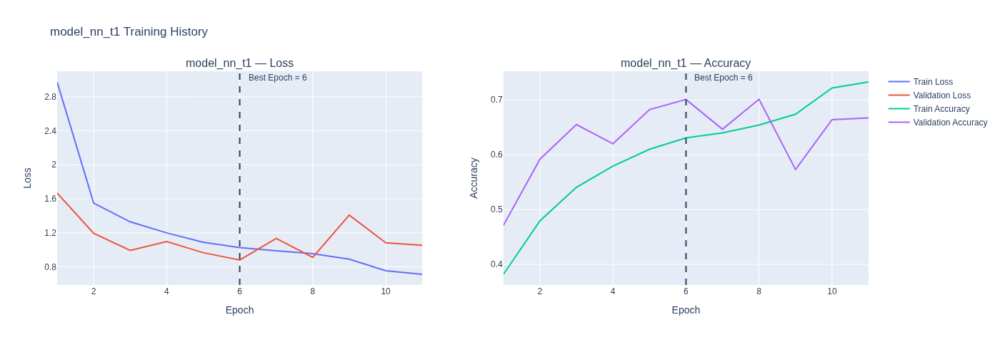

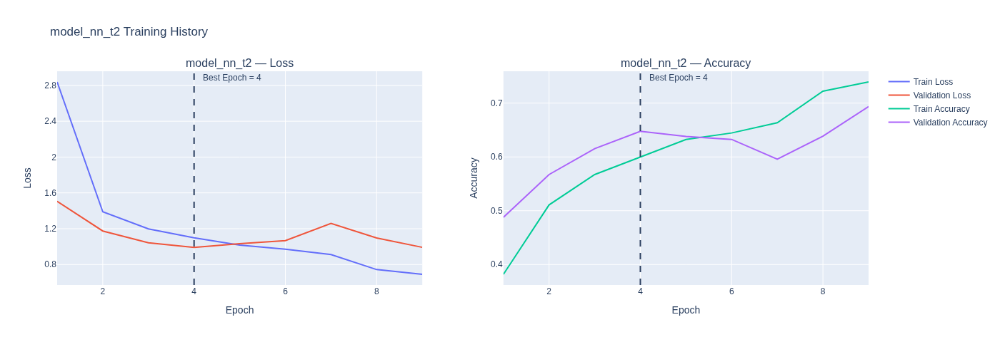

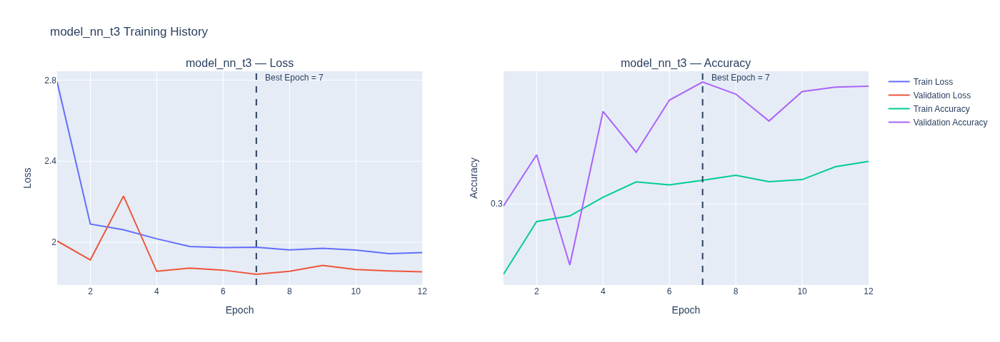

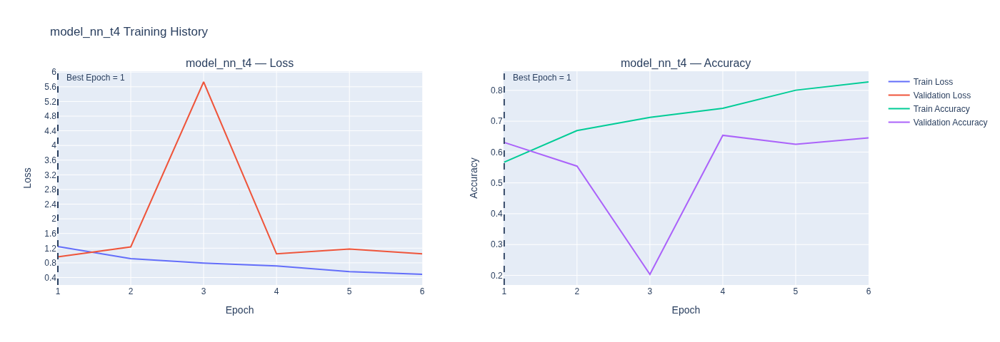

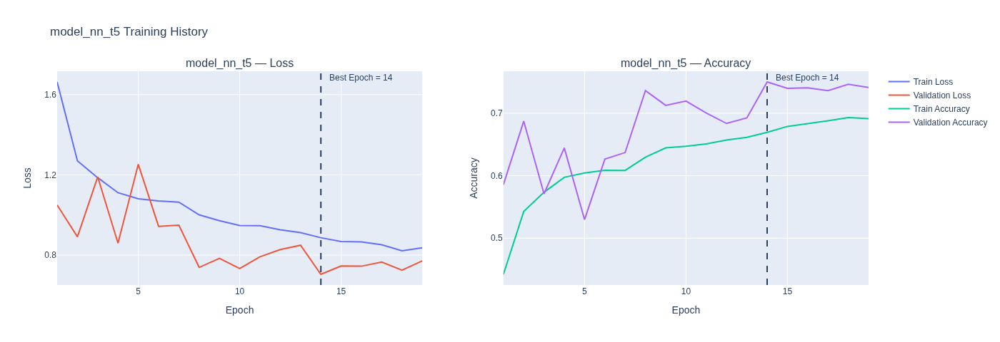

In [41]:
print("Displaying NN Models' Training Plots:")
for i, config in enumerate(configs_nn, start=1):
    model_name = f"model_nn_t{i}"
    history = histories_nn[model_name]
    plot_history(history, model_name)

#### Result Summarisation and Finding the best model

We compiled five NN models in this section. Each model has thier unique Configuration or Hyper-paramenter and inteded purposes.
1.  First Model is Deeper Model. It contains Deeper layer than the initial baseline model.

2. Second Model is Wider Model. It composed of wider layer. However, the accuracy of the model decreased and the model is underfitted.

3. In the Third Model, we introduced the model with Dropout function on first model. Since the model is already underfitted using Dropout worsen the training. 

4. In the Fourth model, we did the batch normalisation. With the batch normalisation function the train accuracy and val accuracy improved compared to the previous models and baseline NN model. 

5. In the Final model, we used both Dropout and Batch Normalisation. Dropout was used here to reduced the Gap between Train Acc and Val Acc (Acc Gap<`0.05`). With Dropout, the validation accuracy of the model is increased. Nevertheless, the model is still underfitting and not a great model.

With current configurations model_nn_t5 (Dropout + Batch Normalised) model is the best NN model for the dataset.

# Q3

## CNN Models

### Baseline CNN Model

#### Model and Architecture

In [42]:
#model cnn 1 --- baseline cnn
model_cnn_1 = tf.keras.Sequential([
    Input(shape=(224,224,1)),
    Conv2D(32, (3,3), activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(100, activation='relu'),
    Dense(11, activation='softmax')
])

Plotting Baseline CNN Model's Architecture: 


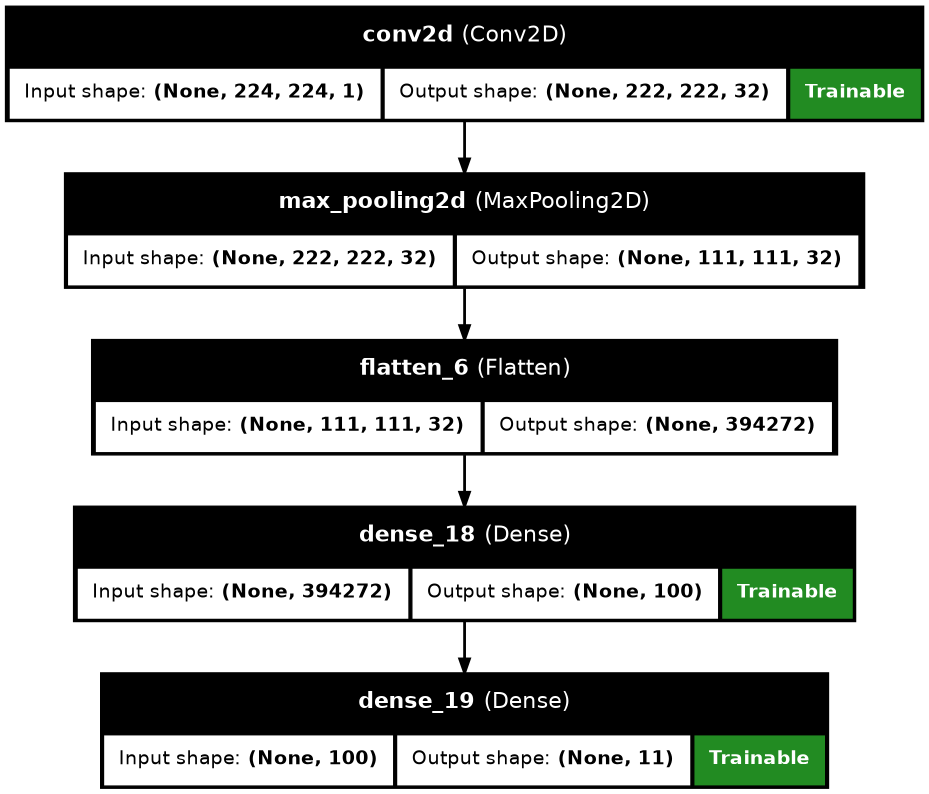

In [43]:
print("Plotting Baseline CNN Model's Architecture: ")
plot_model(model_cnn_1, show_shapes=True, dpi=100, show_layer_names=True, show_trainable=True)

In [44]:
print("Displaying Baseline CNN Model's Summary:")
model_cnn_1.summary(show_trainable=True,)

Displaying Baseline CNN Model's Summary:


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ conv2d (Conv2D)             │ (None, 222, 222, 32)  │        320 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ max_pooling2d               │ (None, 111, 111, 32)  │          0 │   -   │
│ (MaxPooling2D)              │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ flatten_6 (Flatten)         │ (None, 394272)        │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dense_18 (Dense)            │ (None, 100)           │ 39,427,300 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dense_19 (Dense)            │ (None, 11)            │      1,111 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 39,428,731 (150.41 MB)

 Trainable params: 39,428,731 (150.41 MB)

 Non-trainable params: 0 (0.00 B)

#### Model Training

In [45]:
early_stop_loss = EarlyStopping(
        monitor='val_loss',          
        patience=5,               
        restore_best_weights=True 
    )
reduce_lr = ReduceLROnPlateau(
        monitor="val_loss",
        factor=0.5,
        patience=3,
        min_lr=1e-5,
        verbose=1
    )
model_cnn_1.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(),
                 optimizer=tf.keras.optimizers.Adam(),
                 metrics=["accuracy"])

history_cnn_1 = model_cnn_1.fit(X_train, y_train,
                          batch_size=16,
                          validation_data=(X_val, y_val),
                          epochs=50,
                          callbacks = [early_stop_loss, reduce_lr]
                        )

Epoch 1/50


I0000 00:00:1776088591.931634    3998 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_148550__.21
I0000 00:00:1776088593.087722    9681 subprocess_compilation.cc:348] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_MatMul_8', 28 bytes spill stores, 28 bytes spill loads

I0000 00:00:1776088593.275702    9682 subprocess_compilation.cc:348] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_MatMul_8', 76 bytes spill stores, 72 bytes spill loads

I0000 00:00:1776088594.384238    9685 subprocess_compilation.cc:348] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_MatMul_14', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1776088594.488634    9680 subprocess_compilation.cc:348] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_MatMul_14', 16 bytes spill stores, 16 bytes spill loads



866/871 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5284 - loss: 2.3883

I0000 00:00:1776088609.209353    4000 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_148550__.21
I0000 00:00:1776088609.986865    9859 subprocess_compilation.cc:348] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_MatMul_8', 48 bytes spill stores, 44 bytes spill loads

I0000 00:00:1776088610.569108    9858 subprocess_compilation.cc:348] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_MatMul_14', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1776088610.617641    9859 subprocess_compilation.cc:348] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_MatMul_14', 16 bytes spill stores, 16 bytes spill loads



871/871 ━━━━━━━━━━━━━━━━━━━━ 25s 18ms/step - accuracy: 0.6405 - loss: 1.2176 - val_accuracy: 0.8010 - val_loss: 0.5374 - learning_rate: 0.0010
Epoch 2/50
871/871 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - accuracy: 0.7966 - loss: 0.5582 - val_accuracy: 0.8185 - val_loss: 0.5023 - learning_rate: 0.0010
Epoch 3/50
871/871 ━━━━━━━━━━━━━━━━━━━━ 13s 15ms/step - accuracy: 0.8531 - loss: 0.3958 - val_accuracy: 0.8328 - val_loss: 0.5098 - learning_rate: 0.0010
Epoch 4/50
871/871 ━━━━━━━━━━━━━━━━━━━━ 10s 11ms/step - accuracy: 0.8897 - loss: 0.2912 - val_accuracy: 0.8234 - val_loss: 0.5474 - learning_rate: 0.0010
Epoch 5/50
870/871 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.9119 - loss: 0.2299
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
871/871 ━━━━━━━━━━━━━━━━━━━━ 9s 11ms/step - accuracy: 0.9109 - loss: 0.2262 - val_accuracy: 0.8201 - val_loss: 0.6380 - learning_rate: 0.0010
Epoch 6/50
871/871 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step - accuracy: 0.9414 - loss: 0.1349 - 

#### Model Results

In [46]:
results_baseline_cnn = []

history = history_cnn_1

best_epoch = int(np.argmin(history.history["val_loss"]))

train_acc  = history.history["accuracy"][best_epoch]
val_acc    = history.history["val_accuracy"][best_epoch]
train_loss = history.history["loss"][best_epoch]
val_loss   = history.history["val_loss"][best_epoch]

acc_gap  = train_acc - val_acc
loss_gap = val_loss - train_loss

fit_type = fit_group(train_acc, val_acc, train_loss, val_loss)

results_baseline_cnn.append({
    "No": 1,
    "Model": "model_cnn_1",
    "Type": "Baseline CNN (1 Conv block)",
    
    "Best Epoch": best_epoch + 1,

    "Train Acc": train_acc,
    "Train Loss": train_loss,
    "Val Acc": val_acc,
    "Val Loss": val_loss,

    "Fit": fit_type,
    "Acc Gap": acc_gap,
    "Loss Gap": loss_gap
})

In [47]:
df_baseline_cnn = pd.DataFrame(results_baseline_cnn)
df_baseline_cnn = df_baseline_cnn.style.format({
    col: "{:.4f}" for col in df_baseline_cnn.select_dtypes(include="number").columns
}).map(highlight_fit, subset=["Fit"])
df_baseline_cnn

,No,Model,Type,Best Epoch,Train Acc,Train Loss,Val Acc,Val Loss,Fit,Acc Gap,Loss Gap
0,1.0000,model_cnn_1,Baseline CNN (1 Conv block),2.0000,0.7966,0.5582,0.8185,0.5023,Good fit,-0.0219,-0.0559


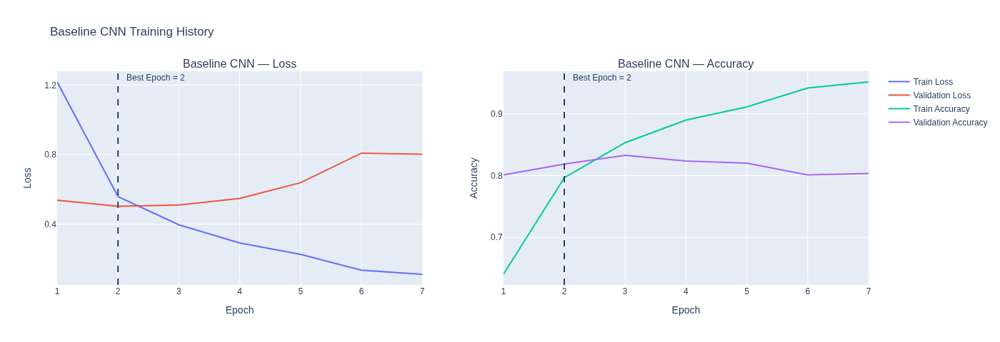

In [48]:
plot_history(history_cnn_1, 'Baseline CNN')

# Q4

## CNN Models

### Modified CNN Models

#### Model and Architecture

In [49]:
#model cnn t1-t5 --- modified cnn
def build_cnn_model(config, input_shape, num_classes):
    model = Sequential()
    model.add(Input(shape=input_shape))

    # Conv blocks: Conv → Conv → Pool
    for filters in config["filters"]:
        # First Conv
        model.add(Conv2D(filters, (3,3), padding='same'))
        if config.get("batchnorm"):
            model.add(BatchNormalization())
        model.add(Activation('relu'))
        # Second Conv
        model.add(Conv2D(filters, (3,3), padding='same'))
        if config.get("batchnorm"):
            model.add(BatchNormalization())
        model.add(Activation('relu'))
        # Pool layer
        model.add(MaxPooling2D())

        if config.get("conv_dropout"):
            model.add(Dropout(config["conv_dropout"]))

    model.add(GlobalAveragePooling2D())

    # Dense layers
    for units in config.get("dense", []):
        model.add(Dense(units, activation='relu'))

        if config.get("dropout"):
            model.add(Dropout(config["dropout"]))

    # Output
    model.add(Dense(num_classes, activation='softmax'))

    model.compile(
        optimizer='adam',
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    return model

configs_cnn = [
    {"name": "Deeper", "filters": [16, 32, 64], "dense": [128]},

    {"name": "Wider","filters": [32, 64, 128],"dense": [128]},

    {"name": "With BatchNormalised", "filters": [16, 32, 64], "dense": [256], "batchnorm": True},

    {"name": "Dropout + Batch Normalised", "filters": [16, 32, 64], "dense": [256], "dropout": 0.3, "batchnorm":True},
    
    {"name": "Dropout + Denser", "filters": [16, 32, 64], "dense": [256], "dropout": 0.3}
]

In [50]:
models_cnn = {}

for i, config in enumerate(configs_cnn, start=1):
    model_name = f"model_cnn_t{i}"
    model = build_cnn_model(config, input_shape, num_classes)
    models_cnn[model_name] = model

Plotting CNN Models' Architecture: 
model_cnn_t1:


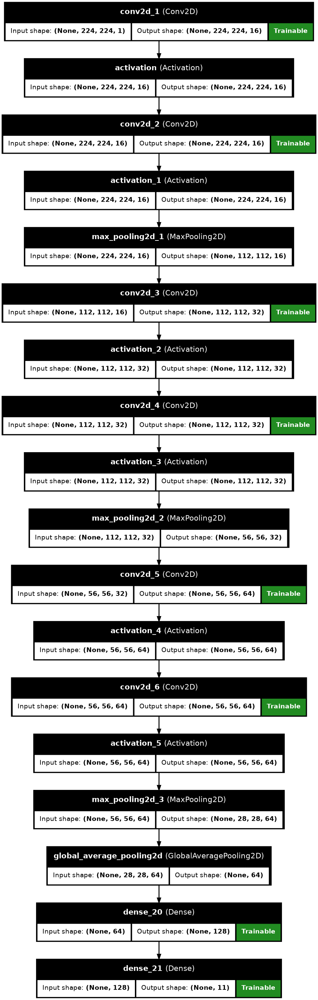

model_cnn_t2:


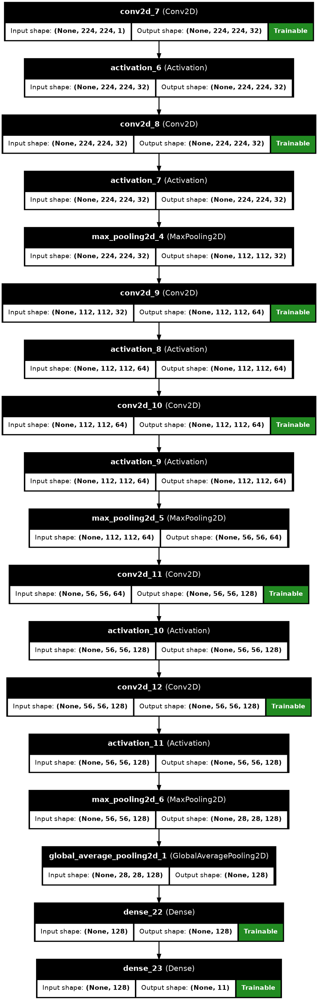

model_cnn_t3:


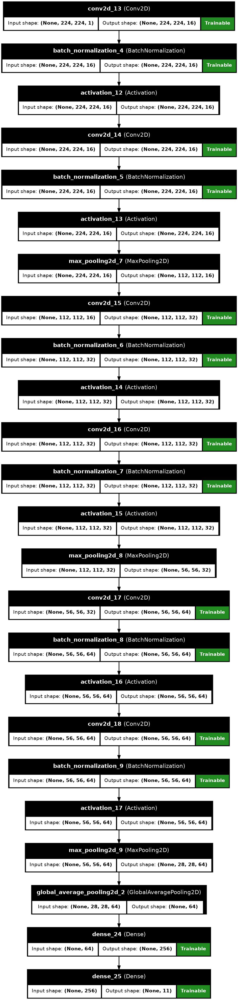

model_cnn_t4:


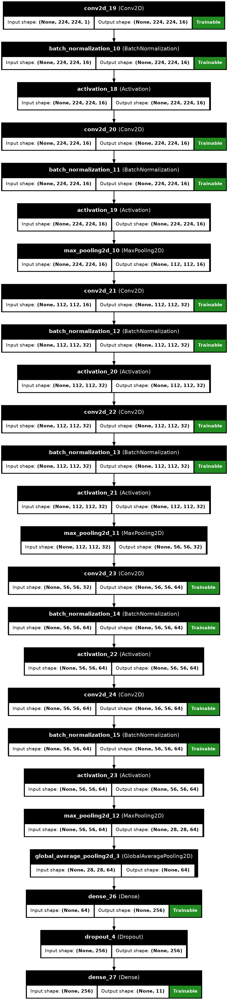

model_cnn_t5:


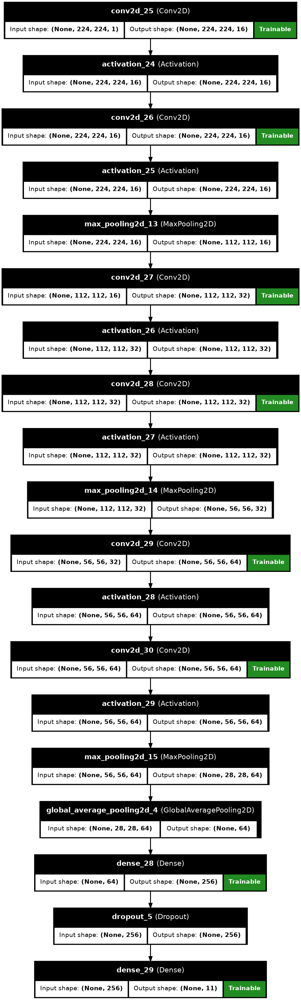

In [51]:
print("Plotting CNN Models' Architecture: ")
plot_archi(models_cnn)

In [52]:
print("Displaying CNN Models' Summary:")
plot_summ(models_cnn)

Displaying CNN Models' Summary:

model_cnn_t1:


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ conv2d_1 (Conv2D)           │ (None, 224, 224, 16)  │        160 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation (Activation)     │ (None, 224, 224, 16)  │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv2d_2 (Conv2D)           │ (None, 224, 224, 16)  │      2,320 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_1 (Activation)   │ (None, 224, 224, 16)  │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ max_pooling2d_1             │ (None, 112, 112, 16)  │          0 │   -   │
│ (MaxPooling2D)              │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv2d_3 (Conv2D)           │ (None, 112, 112, 32)  │      4,640 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_2 (Activation)   │ (None, 112, 112, 32)  │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv2d_4 (Conv2D)           │ (None, 112, 112, 32)  │      9,248 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_3 (Activation)   │ (None, 112, 112, 32)  │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ max_pooling2d_2             │ (None, 56, 56, 32)    │          0 │   -   │
│ (MaxPooling2D)              │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv2d_5 (Conv2D)           │ (None, 56, 56, 64)    │     18,496 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_4 (Activation)   │ (None, 56, 56, 64)    │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv2d_6 (Conv2D)           │ (None, 56, 56, 64)    │     36,928 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_5 (Activation)   │ (None, 56, 56, 64)    │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ max_pooling2d_3             │ (None, 28, 28, 64)    │          0 │   -   │
│ (MaxPooling2D)              │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ global_average_pooling2d    │ (None, 64)            │          0 │   -   │
│ (GlobalAveragePooling2D)    │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dense_20 (Dense)            │ (None, 128)           │      8,320 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dense_21 (Dense)            │ (None, 11)            │      1,419 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 81,531 (318.48 KB)

 Trainable params: 81,531 (318.48 KB)

 Non-trainable params: 0 (0.00 B)


model_cnn_t2:


Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ conv2d_7 (Conv2D)           │ (None, 224, 224, 32)  │        320 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_6 (Activation)   │ (None, 224, 224, 32)  │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv2d_8 (Conv2D)           │ (None, 224, 224, 32)  │      9,248 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_7 (Activation)   │ (None, 224, 224, 32)  │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ max_pooling2d_4             │ (None, 112, 112, 32)  │          0 │   -   │
│ (MaxPooling2D)              │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv2d_9 (Conv2D)           │ (None, 112, 112, 64)  │     18,496 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_8 (Activation)   │ (None, 112, 112, 64)  │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv2d_10 (Conv2D)          │ (None, 112, 112, 64)  │     36,928 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_9 (Activation)   │ (None, 112, 112, 64)  │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ max_pooling2d_5             │ (None, 56, 56, 64)    │          0 │   -   │
│ (MaxPooling2D)              │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv2d_11 (Conv2D)          │ (None, 56, 56, 128)   │     73,856 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_10 (Activation)  │ (None, 56, 56, 128)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv2d_12 (Conv2D)          │ (None, 56, 56, 128)   │    147,584 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_11 (Activation)  │ (None, 56, 56, 128)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ max_pooling2d_6             │ (None, 28, 28, 128)   │          0 │   -   │
│ (MaxPooling2D)              │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ global_average_pooling2d_1  │ (None, 128)           │          0 │   -   │
│ (GlobalAveragePooling2D)    │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dense_22 (Dense)            │ (None, 128)           │     16,512 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dense_23 (Dense)            │ (None, 11)            │      1,419 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 304,363 (1.16 MB)

 Trainable params: 304,363 (1.16 MB)

 Non-trainable params: 0 (0.00 B)


model_cnn_t3:


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ conv2d_13 (Conv2D)          │ (None, 224, 224, 16)  │        160 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ batch_normalization_4       │ (None, 224, 224, 16)  │         64 │   Y   │
│ (BatchNormalization)        │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_12 (Activation)  │ (None, 224, 224, 16)  │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv2d_14 (Conv2D)          │ (None, 224, 224, 16)  │      2,320 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ batch_normalization_5       │ (None, 224, 224, 16)  │         64 │   Y   │
│ (BatchNormalization)        │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_13 (Activation)  │ (None, 224, 224, 16)  │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ max_pooling2d_7             │ (None, 112, 112, 16)  │          0 │   -   │
│ (MaxPooling2D)              │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv2d_15 (Conv2D)          │ (None, 112, 112, 32)  │      4,640 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ batch_normalization_6       │ (None, 112, 112, 32)  │        128 │   Y   │
│ (BatchNormalization)        │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_14 (Activation)  │ (None, 112, 112, 32)  │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv2d_16 (Conv2D)          │ (None, 112, 112, 32)  │      9,248 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ batch_normalization_7       │ (None, 112, 112, 32)  │        128 │   Y   │
│ (BatchNormalization)        │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_15 (Activation)  │ (None, 112, 112, 32)  │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ max_pooling2d_8             │ (None, 56, 56, 32)    │          0 │   -   │
│ (MaxPooling2D)              │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv2d_17 (Conv2D)          │ (None, 56, 56, 64)    │     18,496 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ batch_normalization_8       │ (None, 56, 56, 64)    │        256 │   Y   │
│ (BatchNormalization)        │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_16 (Activation)  │ (None, 56, 56, 64)    │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv2d_18 (Conv2D)          │ (None, 56, 56, 64)    │     36,928 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ batch_normalization_9       │ (None, 56, 56, 64)    │        256 │   Y   │
│ (BatchNormalization)        │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_17 (Activation)  │ (None, 56, 56, 64)    │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ max_pooling2d_9             │ (None, 28, 28, 64)    │          0 │   - 

 Total params: 92,155 (359.98 KB)

 Trainable params: 91,707 (358.23 KB)

 Non-trainable params: 448 (1.75 KB)


model_cnn_t4:


Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ conv2d_19 (Conv2D)          │ (None, 224, 224, 16)  │        160 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ batch_normalization_10      │ (None, 224, 224, 16)  │         64 │   Y   │
│ (BatchNormalization)        │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_18 (Activation)  │ (None, 224, 224, 16)  │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv2d_20 (Conv2D)          │ (None, 224, 224, 16)  │      2,320 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ batch_normalization_11      │ (None, 224, 224, 16)  │         64 │   Y   │
│ (BatchNormalization)        │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_19 (Activation)  │ (None, 224, 224, 16)  │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ max_pooling2d_10            │ (None, 112, 112, 16)  │          0 │   -   │
│ (MaxPooling2D)              │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv2d_21 (Conv2D)          │ (None, 112, 112, 32)  │      4,640 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ batch_normalization_12      │ (None, 112, 112, 32)  │        128 │   Y   │
│ (BatchNormalization)        │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_20 (Activation)  │ (None, 112, 112, 32)  │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv2d_22 (Conv2D)          │ (None, 112, 112, 32)  │      9,248 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ batch_normalization_13      │ (None, 112, 112, 32)  │        128 │   Y   │
│ (BatchNormalization)        │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_21 (Activation)  │ (None, 112, 112, 32)  │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ max_pooling2d_11            │ (None, 56, 56, 32)    │          0 │   -   │
│ (MaxPooling2D)              │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv2d_23 (Conv2D)          │ (None, 56, 56, 64)    │     18,496 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ batch_normalization_14      │ (None, 56, 56, 64)    │        256 │   Y   │
│ (BatchNormalization)        │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_22 (Activation)  │ (None, 56, 56, 64)    │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv2d_24 (Conv2D)          │ (None, 56, 56, 64)    │     36,928 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ batch_normalization_15      │ (None, 56, 56, 64)    │        256 │   Y   │
│ (BatchNormalization)        │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_23 (Activation)  │ (None, 56, 56, 64)    │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ max_pooling2d_12            │ (None, 28, 28, 64)    │          0 │   - 

 Total params: 92,155 (359.98 KB)

 Trainable params: 91,707 (358.23 KB)

 Non-trainable params: 448 (1.75 KB)


model_cnn_t5:


Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ conv2d_25 (Conv2D)          │ (None, 224, 224, 16)  │        160 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_24 (Activation)  │ (None, 224, 224, 16)  │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv2d_26 (Conv2D)          │ (None, 224, 224, 16)  │      2,320 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_25 (Activation)  │ (None, 224, 224, 16)  │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ max_pooling2d_13            │ (None, 112, 112, 16)  │          0 │   -   │
│ (MaxPooling2D)              │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv2d_27 (Conv2D)          │ (None, 112, 112, 32)  │      4,640 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_26 (Activation)  │ (None, 112, 112, 32)  │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv2d_28 (Conv2D)          │ (None, 112, 112, 32)  │      9,248 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_27 (Activation)  │ (None, 112, 112, 32)  │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ max_pooling2d_14            │ (None, 56, 56, 32)    │          0 │   -   │
│ (MaxPooling2D)              │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv2d_29 (Conv2D)          │ (None, 56, 56, 64)    │     18,496 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_28 (Activation)  │ (None, 56, 56, 64)    │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv2d_30 (Conv2D)          │ (None, 56, 56, 64)    │     36,928 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_29 (Activation)  │ (None, 56, 56, 64)    │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ max_pooling2d_15            │ (None, 28, 28, 64)    │          0 │   -   │
│ (MaxPooling2D)              │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ global_average_pooling2d_4  │ (None, 64)            │          0 │   -   │
│ (GlobalAveragePooling2D)    │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dense_28 (Dense)            │ (None, 256)           │     16,640 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dropout_5 (Dropout)         │ (None, 256)           │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dense_29 (Dense)            │ (None, 11)            │      2,827 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 91,259 (356.48 KB)

 Trainable params: 91,259 (356.48 KB)

 Non-trainable params: 0 (0.00 B)

#### Model Training

In [53]:
histories_cnn = {}
for i, (model_name, model) in enumerate(models_cnn.items()):
    config = configs_cnn[i]
    print(f"Training: {model_name} ({config['name']})")

    early_stop_loss = EarlyStopping(
        monitor='val_loss',
        patience=5,
        restore_best_weights=True
    )

    reduce_lr = ReduceLROnPlateau(
        monitor="val_loss",
        factor=0.5,
        patience=3,
        min_lr=1e-5,
        verbose=1
    )

    history = model.fit(
        X_train, y_train,
        validation_data=(X_val, y_val),
        epochs=50,
        batch_size=32,
        callbacks=[early_stop_loss, reduce_lr],
        verbose=1
    )

    histories_cnn[model_name] = history
    print("\n")

Training: model_cnn_t1 (Deeper)
Epoch 1/50


I0000 00:00:1776088689.227560    3998 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_181668__.43


435/436 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.3614 - loss: 1.8278

I0000 00:00:1776088708.161642    4002 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_181668__.43


436/436 ━━━━━━━━━━━━━━━━━━━━ 30s 52ms/step - accuracy: 0.4084 - loss: 1.6081 - val_accuracy: 0.4139 - val_loss: 1.4410 - learning_rate: 0.0010
Epoch 2/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.4882 - loss: 1.2920 - val_accuracy: 0.4690 - val_loss: 1.3448 - learning_rate: 0.0010
Epoch 3/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - accuracy: 0.5688 - loss: 1.0653 - val_accuracy: 0.5836 - val_loss: 0.9792 - learning_rate: 0.0010
Epoch 4/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - accuracy: 0.6411 - loss: 0.8601 - val_accuracy: 0.6183 - val_loss: 0.8888 - learning_rate: 0.0010
Epoch 5/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - accuracy: 0.6853 - loss: 0.7536 - val_accuracy: 0.6876 - val_loss: 0.7745 - learning_rate: 0.0010
Epoch 6/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 14s 32ms/step - accuracy: 0.7100 - loss: 0.6848 - val_accuracy: 0.7268 - val_loss: 0.6630 - learning_rate: 0.0010
Epoch 7/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.7258 - loss: 0.6411

I0000 00:00:1776089030.278889    4001 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_239387__.43


434/436 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - accuracy: 0.3583 - loss: 1.8129

I0000 00:00:1776089062.690018    4000 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_239387__.43


436/436 ━━━━━━━━━━━━━━━━━━━━ 45s 83ms/step - accuracy: 0.4172 - loss: 1.5601 - val_accuracy: 0.4747 - val_loss: 1.3318 - learning_rate: 0.0010
Epoch 2/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 25s 56ms/step - accuracy: 0.5143 - loss: 1.2197 - val_accuracy: 0.5371 - val_loss: 1.1242 - learning_rate: 0.0010
Epoch 3/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 21s 47ms/step - accuracy: 0.6032 - loss: 0.9629 - val_accuracy: 0.7182 - val_loss: 0.7032 - learning_rate: 0.0010
Epoch 4/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.6982 - loss: 0.7157 - val_accuracy: 0.7965 - val_loss: 0.5035 - learning_rate: 0.0010
Epoch 5/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 22s 51ms/step - accuracy: 0.7402 - loss: 0.6214 - val_accuracy: 0.8193 - val_loss: 0.4322 - learning_rate: 0.0010
Epoch 6/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 20s 45ms/step - accuracy: 0.7588 - loss: 0.5680 - val_accuracy: 0.7822 - val_loss: 0.4916 - learning_rate: 0.0010
Epoch 7/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step - accuracy: 0.7766 - loss: 0.5234

I0000 00:00:1776089567.907813    4002 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_291194__.78


433/436 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.5646 - loss: 1.1741

I0000 00:00:1776089587.377796    4002 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_291194__.78


436/436 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.6245 - loss: 0.9477 - val_accuracy: 0.1860 - val_loss: 4.1096 - learning_rate: 0.0010
Epoch 2/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - accuracy: 0.7234 - loss: 0.6579 - val_accuracy: 0.3923 - val_loss: 5.9498 - learning_rate: 0.0010
Epoch 3/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - accuracy: 0.7604 - loss: 0.5661 - val_accuracy: 0.4988 - val_loss: 4.0676 - learning_rate: 0.0010
Epoch 4/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - accuracy: 0.7845 - loss: 0.5080 - val_accuracy: 0.6321 - val_loss: 1.6873 - learning_rate: 0.0010
Epoch 5/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - accuracy: 0.8048 - loss: 0.4655 - val_accuracy: 0.4759 - val_loss: 5.0402 - learning_rate: 0.0010
Epoch 6/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - accuracy: 0.8147 - loss: 0.4320 - val_accuracy: 0.4992 - val_loss: 4.8548 - learning_rate: 0.0010
Epoch 7/50
434/436 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.8183 - loss: 0.4194


I0000 00:00:1776089712.893666    4001 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_316217__.79


435/436 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.5387 - loss: 1.2308

I0000 00:00:1776089732.157100    3999 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_316217__.79


436/436 ━━━━━━━━━━━━━━━━━━━━ 30s 49ms/step - accuracy: 0.6006 - loss: 1.0142 - val_accuracy: 0.2378 - val_loss: 4.0752 - learning_rate: 0.0010
Epoch 2/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - accuracy: 0.7089 - loss: 0.7088 - val_accuracy: 0.7378 - val_loss: 0.6999 - learning_rate: 0.0010
Epoch 3/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - accuracy: 0.7492 - loss: 0.5969 - val_accuracy: 0.5852 - val_loss: 1.0921 - learning_rate: 0.0010
Epoch 4/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - accuracy: 0.7743 - loss: 0.5397 - val_accuracy: 0.7940 - val_loss: 0.5694 - learning_rate: 0.0010
Epoch 5/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - accuracy: 0.7869 - loss: 0.4972 - val_accuracy: 0.6305 - val_loss: 1.2678 - learning_rate: 0.0010
Epoch 6/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - accuracy: 0.8005 - loss: 0.4659 - val_accuracy: 0.7675 - val_loss: 0.6493 - learning_rate: 0.0010
Epoch 7/50
435/436 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.8055 - loss: 0.4441


I0000 00:00:1776089851.521475    3998 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_338722__.44


434/436 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.3379 - loss: 1.9116

I0000 00:00:1776089866.951556    3999 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_338722__.44


436/436 ━━━━━━━━━━━━━━━━━━━━ 22s 42ms/step - accuracy: 0.3960 - loss: 1.6534 - val_accuracy: 0.4368 - val_loss: 1.3039 - learning_rate: 0.0010
Epoch 2/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.4890 - loss: 1.2518 - val_accuracy: 0.5563 - val_loss: 0.9998 - learning_rate: 0.0010
Epoch 3/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5851 - loss: 0.9919 - val_accuracy: 0.6138 - val_loss: 0.8671 - learning_rate: 0.0010
Epoch 4/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - accuracy: 0.6449 - loss: 0.8405 - val_accuracy: 0.7157 - val_loss: 0.6392 - learning_rate: 0.0010
Epoch 5/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.6914 - loss: 0.7238 - val_accuracy: 0.7573 - val_loss: 0.5477 - learning_rate: 0.0010
Epoch 6/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - accuracy: 0.7200 - loss: 0.6581 - val_accuracy: 0.7382 - val_loss: 0.5488 - learning_rate: 0.0010
Epoch 7/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - accuracy: 0.7378 - loss: 0.6179

#### Model Results

In [54]:
results_cnn = []

for i, config in enumerate(configs_cnn, start=1):
    model_name = f"model_cnn_t{i}"
    history = histories_cnn[model_name]

    best_epoch = int(np.argmin(history.history["val_loss"]))

    train_acc  = history.history["accuracy"][best_epoch]
    val_acc    = history.history["val_accuracy"][best_epoch]
    train_loss = history.history["loss"][best_epoch]
    val_loss   = history.history["val_loss"][best_epoch]

    acc_gap  = train_acc - val_acc
    loss_gap = val_loss - train_loss

    fit_type = fit_group(train_acc, val_acc, train_loss, val_loss)

    results_cnn.append({
        "No": i,
        "Model": model_name,
        "Config": config["name"],
        "Filters": str(config["filters"]),
        "Dense": str(config.get("dense", [])),
        "Dropout": config.get("dropout", 0),
        "BatchNorm": config.get("batchnorm", False),

        "Best Epoch": best_epoch + 1,

        "Train Acc": train_acc,
        "Train Loss": train_loss,
        "Val Acc": val_acc,
        "Val Loss": val_loss,

        "Fit": fit_type,
        "Acc Gap": acc_gap,
        "Loss Gap": loss_gap
    })

In [55]:
print("Displaying CNN Models' Result Table on Best Epoch:")
df_results = pd.DataFrame(results_cnn)
df_cnn = df_results.style.format({
    col: "{:.4f}" for col in df_results.select_dtypes(include="number").columns
}).map(highlight_fit, subset=["Fit"]).apply(highlight_best, subset=["Train Acc","Val Acc"])
df_cnn

Displaying CNN Models' Result Table on Best Epoch:


,No,Model,Config,Filters,Dense,Dropout,BatchNorm,Best Epoch,Train Acc,Train Loss,Val Acc,Val Loss,Fit,Acc Gap,Loss Gap
0,1.0000,model_cnn_t1,Deeper,"[16, 32, 64]",[128],0.0000,False,21.0000,0.8682,0.2961,0.8711,0.3342,Good fit,-0.0029,0.0380
1,2.0000,model_cnn_t2,Wider,"[32, 64, 128]",[128],0.0000,False,17.0000,0.8746,0.2844,0.8752,0.3030,Good fit,-0.0006,0.0185
2,3.0000,model_cnn_t3,With BatchNormalised,"[16, 32, 64]",[256],0.0000,True,4.0000,0.7845,0.5080,0.6321,1.6873,Underfitting,0.1523,1.1793
3,4.0000,model_cnn_t4,Dropout + Batch Normalised,"[16, 32, 64]",[256],0.3000,True,4.0000,0.7743,0.5397,0.7940,0.5694,Underfitting,-0.0197,0.0297
4,5.0000,model_cnn_t5,Dropout + Denser,"[16, 32, 64]",[256],0.3000,False,28.0000,0.8849,0.2605,0.8858,0.2752,Good fit,-0.0009,0.0147


Displaying CNN Models' Training Plots:


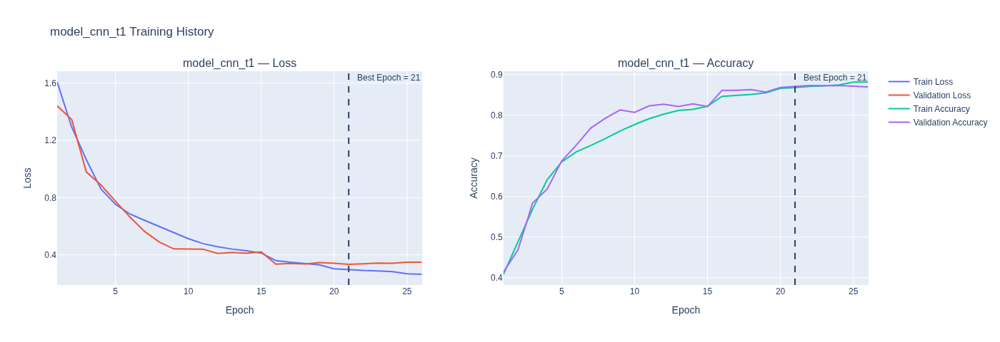

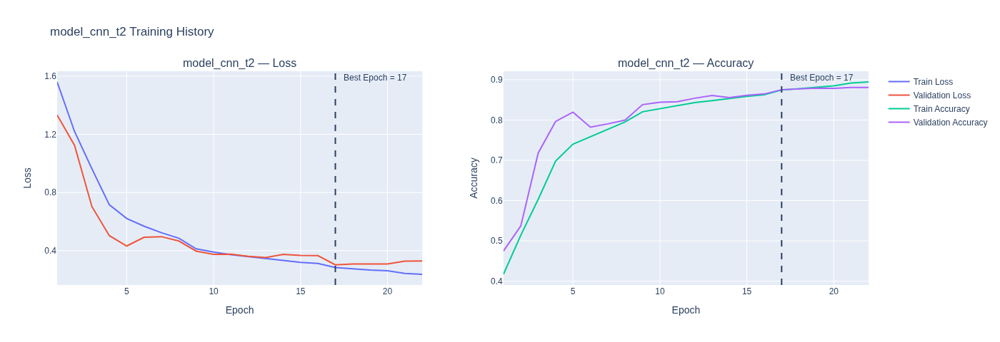

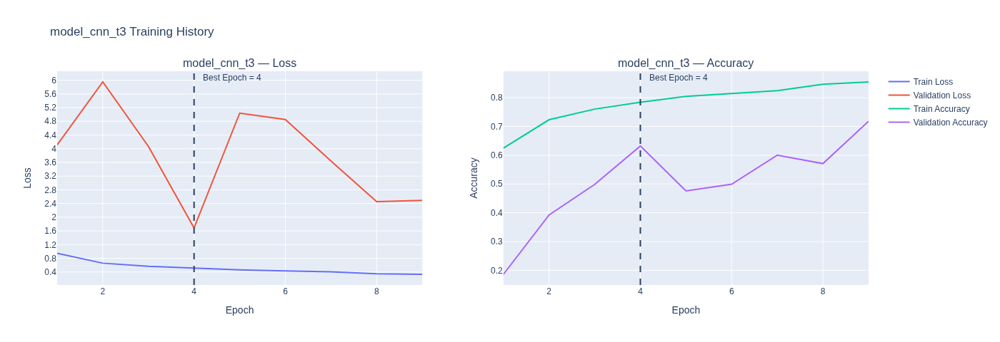

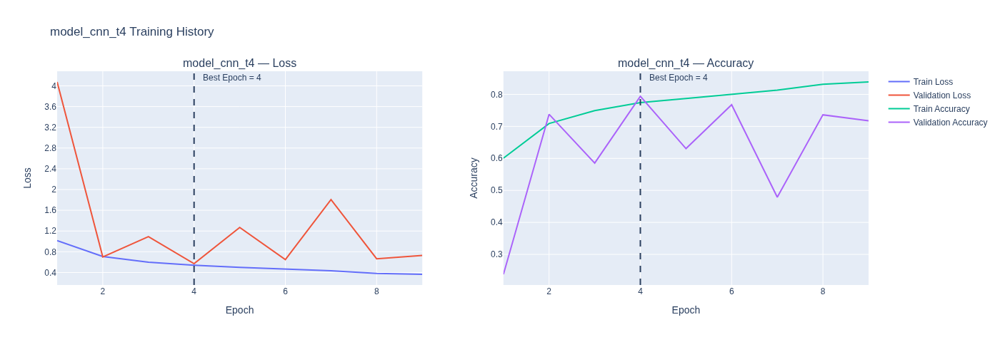

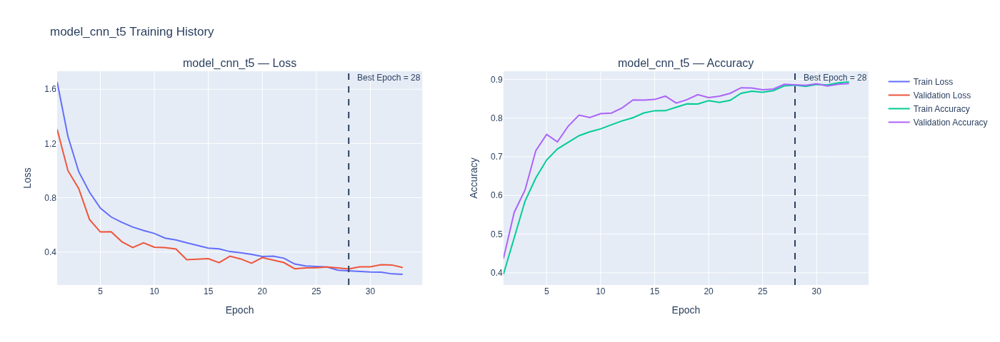

In [56]:
print("Displaying CNN Models' Training Plots:")
for i, config in enumerate(configs_cnn, start=1):
    model_name = f"model_cnn_t{i}"
    history = histories_cnn[model_name]
    plot_history(history, model_name)

#### Result Summarisation and Finding the best model

For CNN model hyper tuning, we used a similar Architecture across all models 

1. In first model, we tuned the model to be deeper than the original baseline model. The results improved accuracy significantly and the plots show a convergence as the number of epochs increase and the loss approaching a minimum. 
2. In second model, we tried the wider approach. The results are slightly lower than the first one.
3. Third model, the batch normalisation was carried out with dense 256 instead of dense 128. However, the result are lower when compared to the first modified model. The model is underfitted.
4. Fourth Model, Dropout was used together with Batch Normalisation. However, it worsen both train accuracy and validation accuracy. The model is underfitted.
5. In the Final Model, we remove batch normalisation since the curves was showing the unstable learning rate. The final model only consist dropout 0.3 and dense[256]

In conclusion, we learned that more complex model does not mean better model performance and the model_cnn_t5 model has validation accuracy of [0.8858] only slightly higher than model_cnn_t1[0.8711] and model_cnn_t2[0.8752].
Thus, model_cnn_t5 will be chose for further test and evaluations.

*** 
* Disclaimer: Although some of the top CNN variants produced relatively close validation performance, model_cnn_t5 achieved the strongest result in this notebook run and was therefore selected for further evaluation.If the models were to run again First modified CNN model, second CNN model or Final CNN model can outperforms each other. The best model during the time of running this notebook was model_cnn_t5 with best epoch outperforming other models' (model_cnn_t1 and model_cnn_t2) best epoch. The lack of proper reproducability appears to be due to the kernel and GPU/CPU processing which produces differing results when the models are re-executed.  
 

# Q5

## Transfer Learning Models

### Data preprocessing for Transfer Learning Models

In [57]:
def create_tl_dataset(X, y, batch_size, preprocess_fn):
    ds = tf.data.Dataset.from_tensor_slices((X, y))

    def preprocess(x, y):
        x = tf.cast(x, tf.float32)

        x = tf.expand_dims(x, axis=-1)

        x = tf.image.grayscale_to_rgb(x)

        x = preprocess_fn(x)

        return x, y

    ds = ds.map(preprocess, num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)

    return ds

### ResNet50

#### Model

In [58]:
train_ds_resnet = create_tl_dataset(X_train_raw, y_train, 32, resnet_preprocess)
val_ds_resnet   = create_tl_dataset(X_val_raw, y_val, 32, resnet_preprocess)

In [59]:
base = ResNet50(
    weights='imagenet',
    include_top=False,
    input_shape=(224,224,3)
)

In [60]:
#model resnet ---  ResNet50
base.trainable = False
x = GlobalAveragePooling2D()(base.output)
x = Dense(128, activation='relu')(x)
output = Dense(num_classes, activation='softmax')(x)

model_resnet = Model(inputs=base.input, outputs=output)

model_resnet.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

#### Model Training

In [61]:
early_stop_loss = EarlyStopping(
    monitor='val_loss',          
    patience=5,               
    restore_best_weights=True 
)
reduce_lr = ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.5,
    patience=3,
    min_lr=1e-5,
    verbose=1
)

history_resnet = model_resnet.fit(
    train_ds_resnet,
    validation_data=val_ds_resnet,
    epochs=50,
    callbacks=[early_stop_loss, reduce_lr]
)

Epoch 1/50


I0000 00:00:1776090244.697292    3998 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_419289__.181


433/436 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.7246 - loss: 0.7338

I0000 00:00:1776090263.543721    3998 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_419289__.181


436/436 ━━━━━━━━━━━━━━━━━━━━ 35s 59ms/step - accuracy: 0.8013 - loss: 0.5097 - val_accuracy: 0.8777 - val_loss: 0.3206 - learning_rate: 0.0010
Epoch 2/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - accuracy: 0.8894 - loss: 0.2666 - val_accuracy: 0.8781 - val_loss: 0.3249 - learning_rate: 0.0010
Epoch 3/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - accuracy: 0.9175 - loss: 0.1950 - val_accuracy: 0.8785 - val_loss: 0.3238 - learning_rate: 0.0010
Epoch 4/50
435/436 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.9298 - loss: 0.1609
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
436/436 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - accuracy: 0.9334 - loss: 0.1547 - val_accuracy: 0.8768 - val_loss: 0.3475 - learning_rate: 0.0010
Epoch 5/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - accuracy: 0.9556 - loss: 0.1075 - val_accuracy: 0.8809 - val_loss: 0.3935 - learning_rate: 5.0000e-04
Epoch 6/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - accuracy: 0.9671 - loss: 0.08

#### Model Result

In [62]:
results_resnet = []

history = history_resnet

best_epoch = int(np.argmin(history.history["val_loss"]))

train_acc  = history.history["accuracy"][best_epoch]
val_acc    = history.history["val_accuracy"][best_epoch]
train_loss = history.history["loss"][best_epoch]
val_loss   = history.history["val_loss"][best_epoch]

acc_gap  = train_acc - val_acc
loss_gap = val_loss - train_loss

fit_type = fit_group(train_acc, val_acc, train_loss, val_loss)

results_resnet.append({
    "No": 1,
    "Model": "model_resnet",
    "Type": "ResNet50 (1 Dense)",
    
    "Best Epoch": best_epoch + 1,

    "Train Acc": train_acc,
    "Train Loss": train_loss,
    "Val Acc": val_acc,
    "Val Loss": val_loss,

    "Fit": fit_type,
    "Acc Gap": acc_gap,
    "Loss Gap": loss_gap
})

In [63]:
df_results= pd.DataFrame(results_resnet)
df_resnet = df_results.style.format({
    col: "{:.4f}" for col in df_results.select_dtypes(include="number").columns
}).map(highlight_fit, subset=["Fit"])
df_resnet

,No,Model,Type,Best Epoch,Train Acc,Train Loss,Val Acc,Val Loss,Fit,Acc Gap,Loss Gap
0,1.0000,model_resnet,ResNet50 (1 Dense),1.0000,0.8013,0.5097,0.8777,0.3206,Good fit,-0.0763,-0.1891


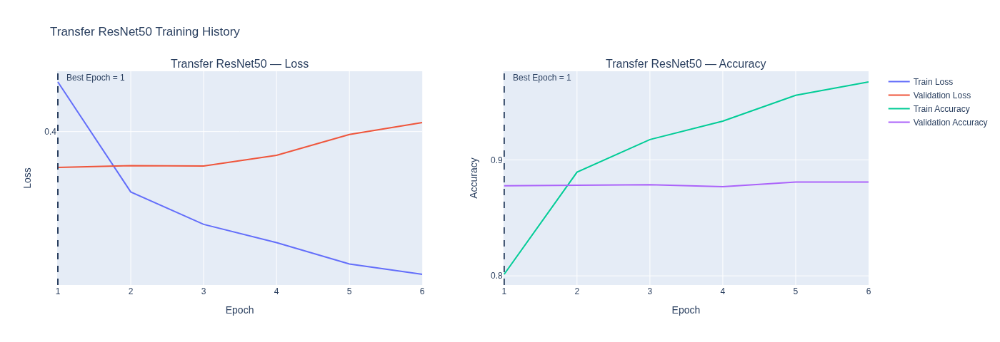

In [64]:
plot_history(history_resnet, 'Transfer ResNet50')

### MobileNetV2

In [65]:
train_ds_mobilenet = create_tl_dataset(X_train_raw, y_train, 32, mobilenet_preprocess)
val_ds_mobilenet   = create_tl_dataset(X_val_raw, y_val, 32, mobilenet_preprocess)

#### Model

In [66]:
# model mobilenet --- MobileNetV2
base = MobileNetV2(
    weights='imagenet',
    include_top=False,
    input_shape=(224,224,3)
)

In [67]:
base.trainable = False
x = GlobalAveragePooling2D()(base.output)
x = Dense(128, activation='relu')(x)
output = Dense(num_classes, activation='softmax')(x)

model_mobilenet = Model(inputs=base.input, outputs=output)

model_mobilenet.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

#### Model Training

In [68]:
early_stop_loss = EarlyStopping(
    monitor='val_loss',          
    patience=5,               
    restore_best_weights=True 
)
reduce_lr = ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.5,
    patience=3,
    min_lr=1e-5,
    verbose=1
)

history_mobilenet = model_mobilenet.fit(
    train_ds_mobilenet,
    validation_data=val_ds_mobilenet,
    epochs=50,
    callbacks=[early_stop_loss, reduce_lr]
)

Epoch 1/50


I0000 00:00:1776090350.611938    4002 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_444623__.118
E0000 00:00:1776090351.351457    4002 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1776090353.319129    4002 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


433/436 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.6672 - loss: 0.9223

I0000 00:00:1776090372.909398    4001 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_444623__.118
E0000 00:00:1776090373.846385    4001 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1776090375.673974    4001 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


436/436 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - accuracy: 0.6678 - loss: 0.9205

E0000 00:00:1776090384.142245    3998 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1776090384.656979    3998 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


436/436 ━━━━━━━━━━━━━━━━━━━━ 41s 62ms/step - accuracy: 0.7494 - loss: 0.6589 - val_accuracy: 0.8397 - val_loss: 0.4052 - learning_rate: 0.0010
Epoch 2/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - accuracy: 0.8457 - loss: 0.3830 - val_accuracy: 0.8348 - val_loss: 0.4310 - learning_rate: 0.0010
Epoch 3/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - accuracy: 0.8834 - loss: 0.2981 - val_accuracy: 0.8613 - val_loss: 0.3865 - learning_rate: 0.0010
Epoch 4/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 15s 35ms/step - accuracy: 0.9048 - loss: 0.2461 - val_accuracy: 0.8308 - val_loss: 0.4956 - learning_rate: 0.0010
Epoch 5/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - accuracy: 0.9196 - loss: 0.2078 - val_accuracy: 0.8283 - val_loss: 0.5567 - learning_rate: 0.0010
Epoch 6/50
435/436 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.9247 - loss: 0.1916
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
436/436 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - accuracy: 0.9332 - loss: 0.1748 -

#### Model Result

In [69]:
results_mobilenet = []

history = history_mobilenet

best_epoch = int(np.argmin(history.history["val_loss"]))

train_acc  = history.history["accuracy"][best_epoch]
val_acc    = history.history["val_accuracy"][best_epoch]
train_loss = history.history["loss"][best_epoch]
val_loss   = history.history["val_loss"][best_epoch]

acc_gap  = train_acc - val_acc
loss_gap = val_loss - train_loss

fit_type = fit_group(train_acc, val_acc, train_loss, val_loss)

results_mobilenet.append({
    "No": 1,
    "Model": "model_mobilenet",
    "Type": "MobileNetV2 (1 Dense)",
    
    "Best Epoch": best_epoch + 1,

    "Train Acc": train_acc,
    "Train Loss": train_loss,
    "Val Acc": val_acc,
    "Val Loss": val_loss,

    "Fit": fit_type,
    "Acc Gap": acc_gap,
    "Loss Gap": loss_gap
})

In [70]:
df_results = pd.DataFrame(results_mobilenet)
df_mobilenet = df_results.style.format({
    col: "{:.4f}" for col in df_results.select_dtypes(include="number").columns
}).map(highlight_fit, subset=["Fit"])
df_mobilenet

,No,Model,Type,Best Epoch,Train Acc,Train Loss,Val Acc,Val Loss,Fit,Acc Gap,Loss Gap
0,1.0000,model_mobilenet,MobileNetV2 (1 Dense),3.0000,0.8834,0.2981,0.8613,0.3865,Good fit,0.0220,0.0884


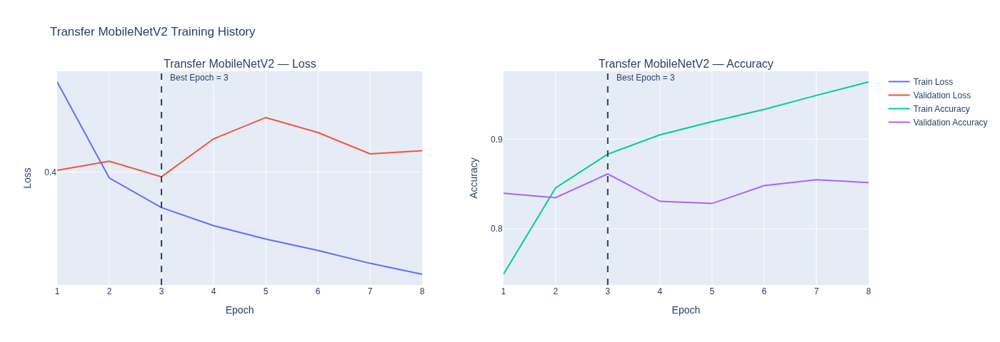

In [71]:
plot_history(history_mobilenet, 'Transfer MobileNetV2')

# Q6

## Evaluation

### Preprocessing For Evaluation

Testsplits for NN and CNN

In [72]:
X_test_nn = X_test
y_test_nn = y_test

Testsplits for Transfer Learned Models 

In [73]:
test_ds_resnet = create_tl_dataset(X_test_raw, y_test, 16, resnet_preprocess)
test_ds_mobilenet = create_tl_dataset(X_test_raw, y_test, 16, mobilenet_preprocess)

### Evaluation Functions

In [74]:
#evaluation functions copied from previous cw
#Evaluate models
def evaluate_models(models, num_classes):

    results = {}
    metrics = {}
    macro_rocs = {}
    micro_rocs = {}

    for name, model, X, y, is_dataset in models:    
        # Predictions 
        if is_dataset:
            y_pred_probs = model.predict(X)
        else:
            y_pred_probs = model.predict(X, verbose=0)

        y_pred = np.argmax(y_pred_probs, axis=1)

        # Basic Metrics 
        acc = accuracy_score(y, y_pred)
        bal_acc = balanced_accuracy_score(y, y_pred)

        micro_rec = recall_score(y, y_pred, average='micro')
        macro_rec = recall_score(y, y_pred, average='macro')

        micro_pre = precision_score(y, y_pred, average='micro', zero_division=0)
        macro_pre = precision_score(y, y_pred, average='macro', zero_division=0)

        micro_f1 = f1_score(y, y_pred, average='micro')
        macro_f1 = f1_score(y, y_pred, average='macro')

        # ROC
        y_bin = label_binarize(y, classes=range(num_classes))

        macro_auc = roc_auc_score(y_bin, y_pred_probs, average="macro")
        micro_auc = roc_auc_score(y_bin, y_pred_probs, average="micro")

        # Micro ROC
        fpr_micro, tpr_micro, _ = roc_curve(
            y_bin.ravel(), y_pred_probs.ravel()
        )

        # Per-class ROC
        per_class = {}
        fpr_dict = {}
        tpr_dict = {}

        for i in range(num_classes):
            fpr_i, tpr_i, _ = roc_curve(y_bin[:, i], y_pred_probs[:, i])
            per_class[i] = (fpr_i, tpr_i)
            fpr_dict[i] = fpr_i
            tpr_dict[i] = tpr_i

        # Macro ROC
        all_fpr = np.unique(np.concatenate([fpr_dict[i] for i in range(num_classes)]))
        mean_tpr = np.zeros_like(all_fpr)

        for i in range(num_classes):
            mean_tpr += np.interp(all_fpr, fpr_dict[i], tpr_dict[i])

        mean_tpr /= num_classes

        macro_rocs[name] = (all_fpr, mean_tpr)
        micro_rocs[name] = (fpr_micro, tpr_micro)

        # Confusion Matrix
        cm = confusion_matrix(y, y_pred)

        # Store
        results[name] = {
            "balanced_accuracy": bal_acc,
            "accuracy": acc,
            "micro_recall": micro_rec,
            "macro_recall": macro_rec,
            "micro_precision": micro_pre,
            "macro_precision": macro_pre,
            "micro_f1": micro_f1,
            "macro_f1": macro_f1,
            "macro_auc": macro_auc,
            "micro_auc": micro_auc,
            "confusion_matrix": cm,
            "roc": {
                "macro": macro_rocs[name],
                "micro": micro_rocs[name],
                "per_class": per_class
            }
        }

        metrics[name] = {
            "balanced_accuracy": bal_acc,
            "accuracy": acc,
            "micro_recall": micro_rec,
            "macro_recall": macro_rec,
            "micro_precision": micro_pre,
            "macro_precision": macro_pre,
            "micro_f1": micro_f1,
            "macro_f1": macro_f1,
            "macro_auc": macro_auc,
            "micro_auc": micro_auc,
        }

    # Summary Table
    print("\n" + "="*80)
    print("MODELS PERFORMANCE SUMMARY")
    print("="*80)

    for name, m in results.items():
        print(f"{name}")
        print(f"Accuracy: {m['accuracy']:.4f}")
        print(f"Balanced Accuracy: {m['balanced_accuracy']:.4f}")
        print(f"Micro Precision: {m['micro_precision']:.4f}")
        print(f"Macro Precision: {m['macro_precision']:.4f}")
        print(f"Micro Recall: {m['micro_recall']:.4f}")
        print(f"Macro Recall: {m['macro_recall']:.4f}")
        print(f"Micro F1: {m['micro_f1']:.4f}")
        print(f"Macro F1: {m['macro_f1']:.4f}")
        print(f"Macro AUC: {m['macro_auc']:.4f}")
        print(f"Micro AUC: {m['micro_auc']:.4f}")
        print("-"*60)

    return results, metrics

In [75]:
#plot macro curve
def plot_macro_roc(results):

    fig = go.Figure()

    for name, res in results.items():
        fpr, tpr = res["roc"]["macro"]
        auc = res["macro_auc"]

        fig.add_trace(go.Scatter(
            x=fpr,
            y=tpr,
            mode="lines",
            name=f"{name} (AUC={auc:.3f})"
        ))

    fig.add_trace(go.Scatter(
        x=[0, 1], 
        y=[0, 1],
        mode="lines",
        line=dict(dash="dash"),
        name="Random"
    ))

    fig.update_layout(
        title="Macro-average One-vs-Rest ROC Curves",
        xaxis_title="False Positive Rate",
        yaxis_title="True Positive Rate",
        width=1800,
    )
    fig.show()

In [76]:
#plot micro curve
def plot_micro_roc(results):

    fig = go.Figure()

    for name, res in results.items():
        fpr, tpr = res["roc"]["micro"]
        auc = res["micro_auc"]

        fig.add_trace(go.Scatter(
            x=fpr,
            y=tpr,
            mode="lines",
            name=f"{name} (AUC={auc:.3f})"
        ))

    fig.add_trace(go.Scatter(
        x=[0, 1], y=[0, 1],
        mode="lines",
        line=dict(dash="dash"),
        name="Random"
    ))

    fig.update_layout(
        title="Micro-average One-vs-Rest ROC Curves",
        xaxis_title="False Positive Rate",
        yaxis_title="True Positive Rate",
        width=1800,
    )
    fig.show()

In [77]:
#plot confusion matrix
def plot_confusion_matrices(results, classes):

    for name, res in results.items():
        cm = res["confusion_matrix"]

        fig = ff.create_annotated_heatmap(
            z=cm,
            x=classes,
            y=classes,
            colorscale="Blues"
        )

        fig.update_layout(
            title=f"Confusion Matrix – {name}",
            xaxis=dict(title="Predicted Label", side="bottom"),
            yaxis=dict(title="True Label"),
            width=1400,
        )
        fig.show()

In [78]:
#plot accuracy and error confusion matrix
def plot_acc_err_cm(results, model_name, classes):

    cm = results[model_name]["confusion_matrix"]
    cm_percent = cm.astype(float) / cm.sum(axis=1, keepdims=True) * 100

    acc_cm = np.zeros_like(cm_percent)
    np.fill_diagonal(acc_cm, np.diag(cm_percent))

    err_cm = cm_percent.copy()
    np.fill_diagonal(err_cm, 0)

    labels = classes


    acc_text = np.round(acc_cm, 1).astype(str) + "%"
    err_text = np.round(err_cm, 1).astype(str) + "%"

    fig = make_subplots(
        rows=1, cols=2,
        subplot_titles=("Accuracy (%)", "Error (%)"),
        horizontal_spacing=0.12
    )

    # Acc CM
    fig.add_trace(
        go.Heatmap(
            z=acc_cm,
            x=labels,
            y=labels,
            colorscale="Blues",
            showscale=False,
            text=acc_text,
            texttemplate="%{text}"
        ),
        row=1, col=1
    )

    # Err CM
    fig.add_trace(
        go.Heatmap(
            z=err_cm,
            x=labels,
            y=labels,
            colorscale="Reds",
            showscale=False,
            text=err_text,
            texttemplate="%{text}"
        ),
        row=1, col=2
    )
    fig.update_xaxes(title_text="Predicted Label", row=1, col=1, tickangle=45)
    fig.update_yaxes(title_text="True Label", row=1, col=1)

    fig.update_xaxes(title_text="Predicted Label", row=1, col=2, tickangle=45)
    fig.update_yaxes(title_text="True Label", row=1, col=2)

    fig.update_layout(
        title=f"Confusion Matrix Breakdown – {model_name}",
        height=600,
        width=1900,
    )

    fig.show()

### Evaluating

In [111]:
#loading models
baseline_nn    = model_nn_1
baseline_cnn   = model_cnn_1
best_nn        = models_nn["model_nn_t5"]      
best_cnn       = models_cnn["model_cnn_t5"]       
best_resnet    = model_resnet        
best_mobilenet = model_mobilenet

In [112]:
#loading data for model
models_to_eval = [
    ("Baseline NN", baseline_nn, X_test_nn, y_test_nn, False),
    ("Modified NN", best_nn, X_test_nn, y_test_nn, False),
    ("Baseline CNN", baseline_cnn, X_test_nn, y_test_nn, False),
    ("Modified CNN", best_cnn, X_test_nn, y_test_nn, False),
    ("ResNet50", best_resnet, test_ds_resnet, y_test, True),
    ("MobileNetV2", best_mobilenet, test_ds_mobilenet, y_test, True)
]

In [113]:
#passing it through model evluation function
results_eval, metrics_eval = evaluate_models(models_to_eval, num_classes)

552/552 ━━━━━━━━━━━━━━━━━━━━ 8s 15ms/step
552/552 ━━━━━━━━━━━━━━━━━━━━ 7s 13ms/step

MODELS PERFORMANCE SUMMARY
Baseline NN
Accuracy: 0.3654
Balanced Accuracy: 0.2731
Micro Precision: 0.3654
Macro Precision: 0.3558
Micro Recall: 0.3654
Macro Recall: 0.2731
Micro F1: 0.3654
Macro F1: 0.2159
Macro AUC: 0.7400
Micro AUC: 0.8093
------------------------------------------------------------
Modified NN
Accuracy: 0.5863
Balanced Accuracy: 0.5346
Micro Precision: 0.5863
Macro Precision: 0.5853
Micro Recall: 0.5863
Macro Recall: 0.5346
Micro F1: 0.5863
Macro F1: 0.5496
Macro AUC: 0.9169
Micro AUC: 0.9318
------------------------------------------------------------
Baseline CNN
Accuracy: 0.6530
Balanced Accuracy: 0.5824
Micro Precision: 0.6530
Macro Precision: 0.6416
Micro Recall: 0.6530
Macro Recall: 0.5824
Micro F1: 0.6530
Macro F1: 0.5985
Macro AUC: 0.9472
Micro AUC: 0.9588
------------------------------------------------------------
Modified CNN
Accuracy: 0.7678
Balanced Accuracy: 0.7176
Mic

In [114]:
#Store them for future analysis so you wont need to train model infinite amount of times 
#need modification when using back from csv for confusion_matrix in the dataframe since they will be flattened
df_test_results = pd.DataFrame(results_eval)
df_met_results = pd.DataFrame(metrics_eval)
df_test_results.to_csv("model_test_results.csv")
df_met_results.to_csv("model_met_results.csv")

In [115]:
def highlight_best_row(row):
    max_val = row.max()
    return ['font-weight: bold; color: green; text-decoration: underline' if v == max_val else '' for v in row]

In [116]:
history_final = {}

history_final["base_nn"] = history_nn_1
history_final["modified_nn"]= histories_nn['model_nn_t5']

history_final["base_cnn"] = history_cnn_1
history_final["modified_cnn"]= histories_cnn['model_cnn_t5']

history_final["resnet"] = history_resnet
history_final["mobilenet"] = history_mobilenet

In [117]:
results_final = []
type_map = {
    "mobilenet": "MobileNetV2",
    "resnet": "ResNet50",
    "base_nn": "Baseline NN",
    "modified_nn": "Best Modified NN",
    "modified_cnn": "Best Modified CNN",
    "base_cnn": "Baseline CNN"
}
for i, (name, history) in enumerate(history_final.items(), start=1):
    hist = history.history

    best_epoch = int(np.argmin(hist["val_loss"]))

    train_acc  = hist["accuracy"][best_epoch]
    val_acc    = hist["val_accuracy"][best_epoch]
    train_loss = hist["loss"][best_epoch]
    val_loss   = hist["val_loss"][best_epoch]

    acc_gap  = train_acc - val_acc
    loss_gap = val_loss - train_loss

    fit_type = fit_group(train_acc, val_acc, train_loss, val_loss)

    results_final.append({
        "No": i,
        "Model": type_map.get(name, name),

        "Best Epoch": best_epoch + 1,

        "Train Acc": train_acc,
        "Train Loss": train_loss,
        "Val Acc": val_acc,
        "Val Loss": val_loss,

        "Fit": fit_type,
        "Acc Gap": acc_gap,
        "Loss Gap": loss_gap
    })

In [118]:
df_final = pd.DataFrame(results_final)

df_final = df_final.style.format({
    col: "{:.4f}" 
    for col in df_final.select_dtypes(include="number").columns
}).map(highlight_fit, subset=["Fit"]).apply(highlight_best, subset=["Train Acc","Val Acc"])

df_final

,No,Model,Best Epoch,Train Acc,Train Loss,Val Acc,Val Loss,Fit,Acc Gap,Loss Gap
0,1.0000,Baseline NN,3.0000,0.3934,1.7656,0.4074,1.6021,Underfitting,-0.0140,-0.1635
1,2.0000,Best Modified NN,14.0000,0.6694,0.8869,0.7500,0.7044,Underfitting,-0.0806,-0.1825
2,3.0000,Baseline CNN,2.0000,0.7966,0.5582,0.8185,0.5023,Good fit,-0.0219,-0.0559
3,4.0000,Best Modified CNN,28.0000,0.8849,0.2605,0.8858,0.2752,Good fit,-0.0009,0.0147
4,5.0000,ResNet50,1.0000,0.8013,0.5097,0.8777,0.3206,Good fit,-0.0763,-0.1891
5,6.0000,MobileNetV2,3.0000,0.8834,0.2981,0.8613,0.3865,Good fit,0.0220,0.0884


In [119]:
df_met = df_met_results.copy()
metric_cols = df_met.select_dtypes(include=['number']).columns
print("\nModels Evaluation Chart")
df_met = (
    df_met.style
    .format("{:.4f}")
    .apply(highlight_best_row, axis=1, subset=metric_cols)
)

df_met


Models Evaluation Chart


,Baseline NN,Modified NN,Baseline CNN,Modified CNN,ResNet50,MobileNetV2
balanced_accuracy,0.2731,0.5346,0.5824,0.7176,0.6922,0.6737
accuracy,0.3654,0.5863,0.6530,0.7678,0.7519,0.7253
micro_recall,0.3654,0.5863,0.6530,0.7678,0.7519,0.7253
macro_recall,0.2731,0.5346,0.5824,0.7176,0.6922,0.6737
micro_precision,0.3654,0.5863,0.6530,0.7678,0.7519,0.7253
macro_precision,0.3558,0.5853,0.6416,0.7217,0.7156,0.7015
micro_f1,0.3654,0.5863,0.6530,0.7678,0.7519,0.7253
macro_f1,0.2159,0.5496,0.5985,0.7094,0.6863,0.6635
macro_auc,0.7400,0.9169,0.9472,0.9723,0.9709,0.9659
micro_auc,0.8093,0.9318,0.9588,0.9810,0.9792,0.9741


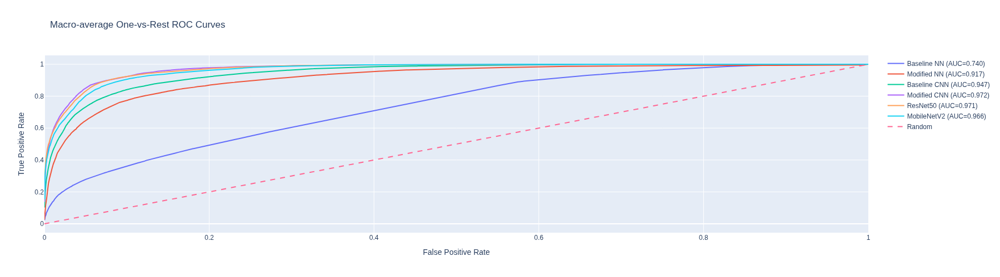

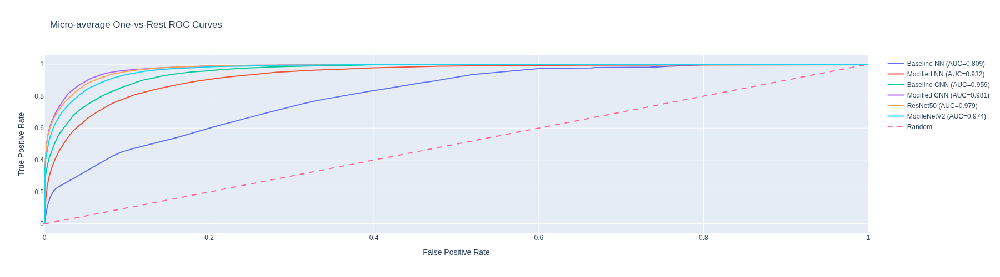

In [120]:
plot_macro_roc(results_eval)
plot_micro_roc(results_eval)    

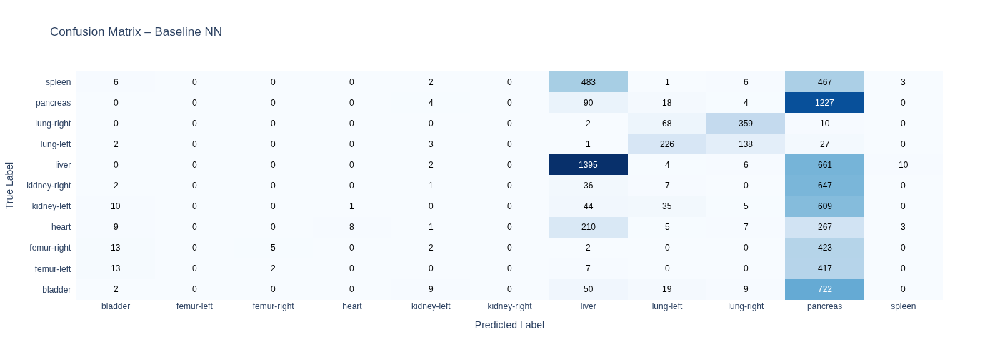

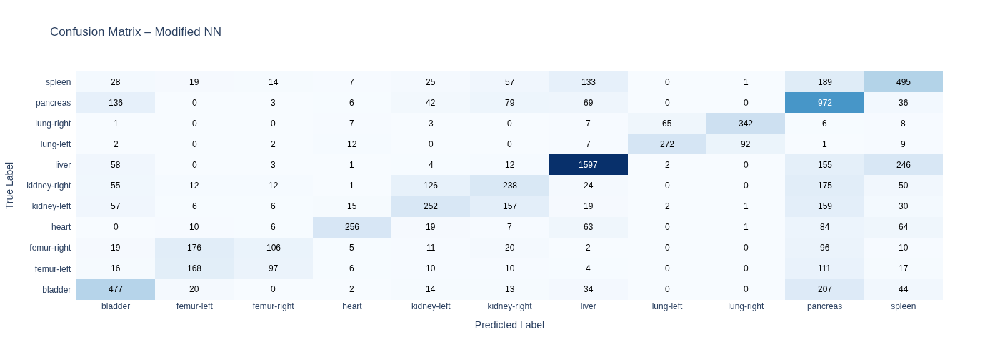

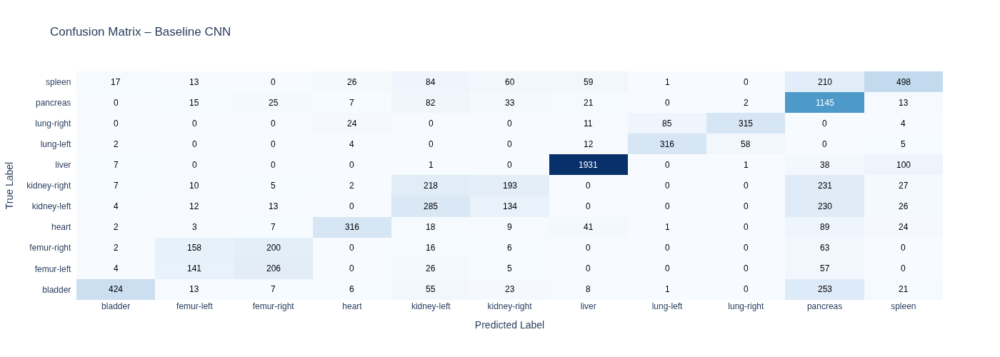

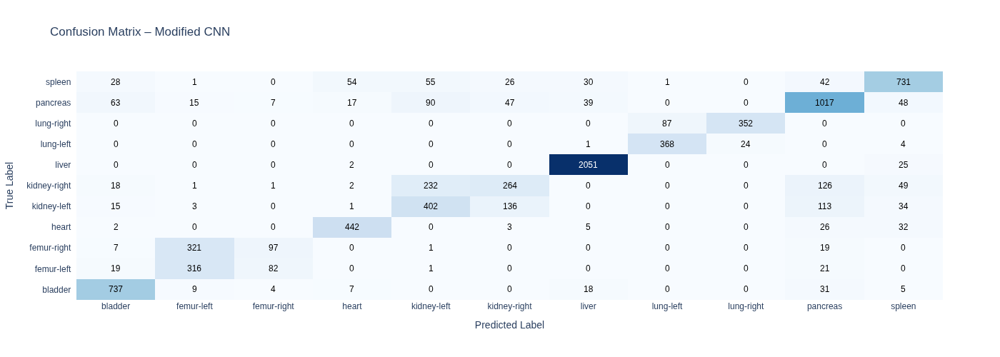

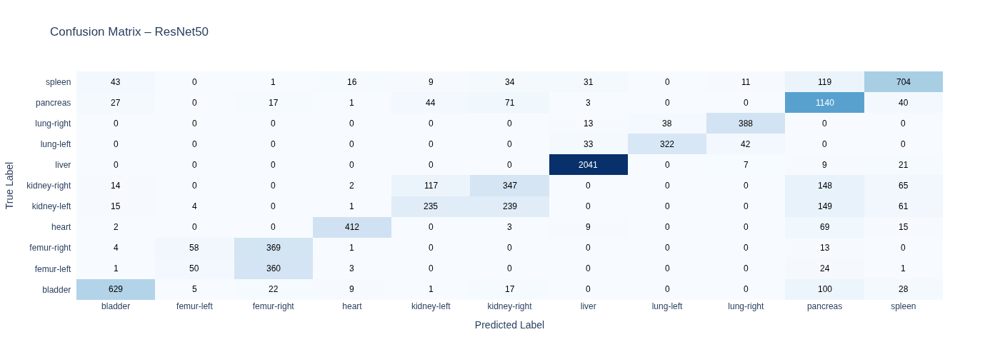

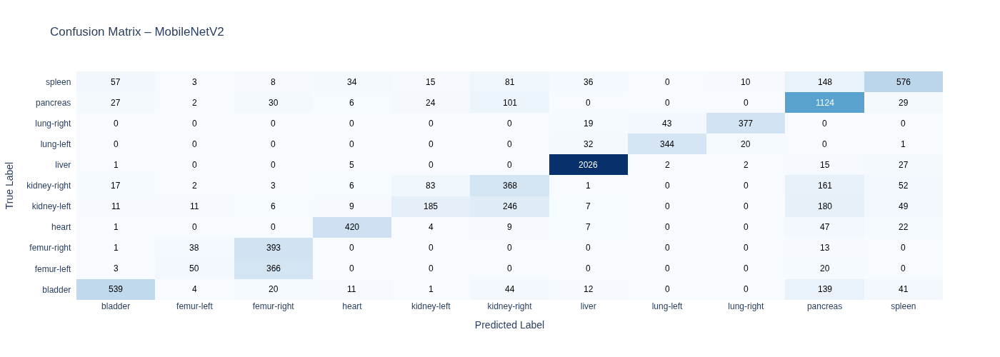

In [121]:
plot_confusion_matrices(results_eval, classes=class_label_list)

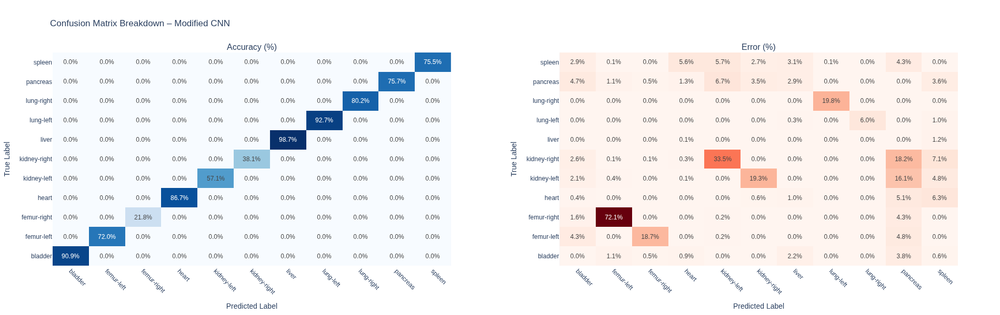

In [122]:
plot_acc_err_cm(results_eval, "Modified CNN", class_label_list)

### Result Conclusions

Following evaluation of the 6 models on the unseen test dataset, the above metrics and visuals demonstrate that the Modified CNN model outperformed every other model on ALL metrics considered in this study.

The Modified CNN model:
1. Was consistent across every class in the dataset.
2. Was consistent across all 3 datasets
3. Provided better regularization
4. Provided higher predictive accuracy
5. Provided the lowest global minimum value of loss
6. Low error rates or misclassification


#### Model Recommendation

In view of the above, the recommended model is the model_cnn_t5, configured with the following hyperparameter settings:

<code style="color : Green">Input Layer of shape (224, 224, 1) </code>
<br/>

<code style="color : Green">Convolutional Block 1 = 2 Conv2D Layers with 16 filters and 1 Maxpooling2D</code> <br/>

<code style="color : Green">Convolutional Block 2 = 2 Conv2D Layers with 32 filters and 1 Maxpooling2D</code><br/>

<code style="color : Green">Convolutional Block 3 = 2 Conv2D Layers with 64 filters and 1 Maxpooling2D</code><br/>

<code style="color : Green">Global Average Pooling Layer</code><br/>

<code style="color : Green">Hidden layer = 1 Hidden Layer with 256 Neurons </code><br/>

<code style="color : Green">Drop out = Drop out Layer with 0.3 </code><br/>

<code style="color : Green">Output Layer = Output Layer with 11 Neurons.</code><br/>


The above configuration resulted in a micro AUC ROC and macro AUC ROC score of 0.9723 and 0.9810 respectivily as seen in the above Models Evaluation Charts [cell 119] (above the current cell).

This is further supported by the ROC curves above [cell 120](above the current cell), where the model_cnn_t5 model is shown to outperform the other models as it's curve lies compartively closer to the top left corner of the graph, indicating a stronger classification performance and it is also much further away from the diagonal that represents random guessing.  

The model_cnn_t5 model also has 81,531 trainable parameters, the lowest number of trainable parameters of all the models, suggesting that it has a comparatively lower computation cost associated with it.  This above therefore demonstrates that the model has effectively learned discriminative patterns and is likely to generalise well on new and unseen data and it more efficeint than the other models.

#### Model's Error Analysis

The “Accuracy (%)” confusion matrix of model_cnn_t5 indicates that most of the organs are correctly classified as reflected by the high values along the diagonal. 

Th most common errors made by the selected model involve the misclassication of organs with left and right sides. However, this is not unique to the selected model, because ALL models in the study appear to get confused with organs that have a left and a right sides, as a result, all models in the study suffered from misclassifing a left organ as a right one and vice versa, not withstanding this, this type of error was significantly reduced in model_cnn_t5 as shown in the above confusion matrices [cell 112] (above the current cell)   

The scale of these errors is further illustrated in the “Errors (%)” confusion matrix, where brighter colours highlight more frequent misclassifications, for example, 72.1% of errors involving organ <code style="color : Green">femur-right</code> are due to
the model misclassifying them as <code style="color : Green">femur-left</code>, whilst, 33.5% of errors involving organ <code style="color : Green">kidney-right</code> were misclassified as <code style="color: Green">kidney-left</code>.

To summarise, organs <span style="color : Green">femur-left</span>, <span style="color : Green">femur-right</span>, <span style="color : Green">kidney-right</span> and <span style="color : Green">kidney-left</span> exhibit notably lower accuracy and this is attributable to misclassification by the model. For instance, 72.1% of organ labled <span style="color : Green">femur-right</span> were misclassified as <span style="color : Green">femur-left</span>, 18.7% of organ labelled <span style="color : Green">femur-left</span> were misclassified as <span style="color : Green">femur-right</span>, 33.5% of organs labelled <span style="color : Green">kidney-right</span> were misclassified as <span style="color : Green">kidney-left</span> and a further 18.2% of organs labelled <span style="color : Green">kidney-right</span> were also misclassified as <span style="color : Green">pancreas</span>. 

#### Possible solution

One possible way to address this issue would be to use augmentation the training data so as to expose the model to different perspectives of the images of these organs to further highlight salient and/or unique features or characteristics of these organs.  

Another approach would be to reconize the fact that the base models have been trained on generic images and as a result, do not capture the intricacies of medical images or images used in the medical setting properly.  As such, the model needs to be specialized or further trained to identify and recognize differences in medical images and this can be achived by further fine tuning or retaining some layers of the base model.  

# Q7

## Retrain with Data Augmentation

In [91]:
datagen = ImageDataGenerator(
    rotation_range=15,        
    width_shift_range=0.1,    
    height_shift_range=0.1,  
    horizontal_flip=True,   
    zoom_range=0.1
)

### Augmented CNN Model Structure and Architecture

In [92]:
model_aug = tf.keras.Sequential([
    Input(shape=input_shape),

    Conv2D(16, (3,3), padding='same'),
    Activation('relu'),
    Conv2D(16, (3,3), padding='same'),
    Activation('relu'),
    MaxPooling2D(),

    Conv2D(32, (3,3), padding='same'),
    Activation('relu'),
    Conv2D(32, (3,3), padding='same'),
    Activation('relu'),
    MaxPooling2D(),

    Conv2D(64, (3,3), padding='same'),
    Activation('relu'),
    Conv2D(64, (3,3), padding='same'),
    Activation('relu'),
    MaxPooling2D(),

    GlobalAveragePooling2D(),

    Dense(256, activation='relu'),
    Dropout(0.3),

    # Output
    Dense(num_classes, activation='softmax')
])

Displaying Augmented CNN Best Model's Architecture:


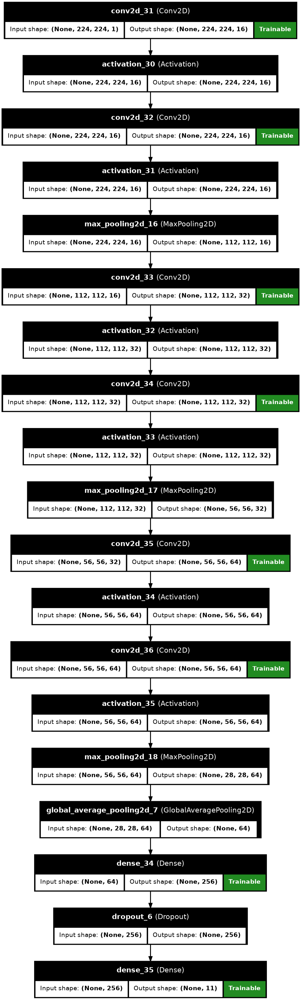

In [93]:
print("Displaying Augmented CNN Best Model's Architecture:")
plot_model(model_aug, show_shapes=True, dpi=100, show_layer_names=True, show_trainable=True)

In [94]:
print("Displaying Augmented CNN Best Model's Summary:")
model_aug.summary(show_trainable=True,)

Displaying Augmented CNN Best Model's Summary:


Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ conv2d_31 (Conv2D)          │ (None, 224, 224, 16)  │        160 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_30 (Activation)  │ (None, 224, 224, 16)  │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv2d_32 (Conv2D)          │ (None, 224, 224, 16)  │      2,320 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_31 (Activation)  │ (None, 224, 224, 16)  │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ max_pooling2d_16            │ (None, 112, 112, 16)  │          0 │   -   │
│ (MaxPooling2D)              │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv2d_33 (Conv2D)          │ (None, 112, 112, 32)  │      4,640 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_32 (Activation)  │ (None, 112, 112, 32)  │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv2d_34 (Conv2D)          │ (None, 112, 112, 32)  │      9,248 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_33 (Activation)  │ (None, 112, 112, 32)  │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ max_pooling2d_17            │ (None, 56, 56, 32)    │          0 │   -   │
│ (MaxPooling2D)              │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv2d_35 (Conv2D)          │ (None, 56, 56, 64)    │     18,496 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_34 (Activation)  │ (None, 56, 56, 64)    │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv2d_36 (Conv2D)          │ (None, 56, 56, 64)    │     36,928 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ activation_35 (Activation)  │ (None, 56, 56, 64)    │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ max_pooling2d_18            │ (None, 28, 28, 64)    │          0 │   -   │
│ (MaxPooling2D)              │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ global_average_pooling2d_7  │ (None, 64)            │          0 │   -   │
│ (GlobalAveragePooling2D)    │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dense_34 (Dense)            │ (None, 256)           │     16,640 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dropout_6 (Dropout)         │ (None, 256)           │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dense_35 (Dense)            │ (None, 11)            │      2,827 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 91,259 (356.48 KB)

 Trainable params: 91,259 (356.48 KB)

 Non-trainable params: 0 (0.00 B)

### Training Augmented Model

In [95]:
early_stop_loss = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

reduce_lr = ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.5,
    patience=3,
    min_lr=1e-5,
    verbose=1
)

model_aug.compile(
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    optimizer=tf.keras.optimizers.Adam(),
    metrics=["accuracy"]
)

history_aug = model_aug.fit(
    datagen.flow(X_train, y_train, batch_size=32),
    validation_data=(X_val, y_val),
    epochs=50,
    callbacks=[early_stop_loss, reduce_lr],
    verbose=1
)

Epoch 1/50


I0000 00:00:1776090597.216120    2784 generator_dataset_op.cc:213] Memory patch applied: M_TRIM_THRESHOLD=128 kb was set.
I0000 00:00:1776090599.236317    3998 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_494146__.44


 81/436 ━━━━━━━━━━━━━━━━━━━━ 31s 90ms/step - accuracy: 0.2224 - loss: 2.2719

I0000 00:00:1776090608.545175    3998 dot_merger.cc:481] Merging Dots in computation: a_inference_one_step_on_data_494146__.44


436/436 ━━━━━━━━━━━━━━━━━━━━ 35s 71ms/step - accuracy: 0.3907 - loss: 1.6910 - val_accuracy: 0.4209 - val_loss: 1.3385 - learning_rate: 0.0010
Epoch 2/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - accuracy: 0.4821 - loss: 1.2941 - val_accuracy: 0.5881 - val_loss: 0.9725 - learning_rate: 0.0010
Epoch 3/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 28s 63ms/step - accuracy: 0.5724 - loss: 1.0558 - val_accuracy: 0.6505 - val_loss: 0.8641 - learning_rate: 0.0010
Epoch 4/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - accuracy: 0.6020 - loss: 0.9747 - val_accuracy: 0.6574 - val_loss: 0.7951 - learning_rate: 0.0010
Epoch 5/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 25s 57ms/step - accuracy: 0.6232 - loss: 0.9192 - val_accuracy: 0.6546 - val_loss: 0.7807 - learning_rate: 0.0010
Epoch 6/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 28s 63ms/step - accuracy: 0.6510 - loss: 0.8438 - val_accuracy: 0.6913 - val_loss: 0.6588 - learning_rate: 0.0010
Epoch 7/50
436/436 ━━━━━━━━━━━━━━━━━━━━ 27s 63ms/step - accuracy: 0.6688 - loss: 0.7825

### Comparing Trained Augmented Model Against Best Model

In [96]:
hist_compare_1 = histories_cnn['model_cnn_t5']
#best epoch
best_epoch_cp1 = np.argmax(hist_compare_1.history['val_accuracy'])
#data for frame

cp1_train_acc  = hist_compare_1.history["accuracy"][best_epoch_cp1]
cp1_train_loss = hist_compare_1.history["loss"][best_epoch_cp1]
cp1_val_acc    = hist_compare_1.history["val_accuracy"][best_epoch_cp1]
cp1_val_loss   = hist_compare_1.history["val_loss"][best_epoch_cp1]

acc_gap_1  = cp1_train_acc - cp1_val_acc
loss_gap_1 = cp1_val_loss - cp1_train_loss

fit_type_1 = fit_group(cp1_train_acc, cp1_val_acc, cp1_train_loss, cp1_val_loss)


In [97]:
#best epoch
best_epoch_cp2 = np.argmax(history_aug.history['val_accuracy'])
#data for frame
cp2_train_acc  = history_aug.history["accuracy"][best_epoch_cp2]
cp2_train_loss = history_aug.history["loss"][best_epoch_cp2]
cp2_val_acc    = history_aug.history["val_accuracy"][best_epoch_cp2]
cp2_val_loss   = history_aug.history["val_loss"][best_epoch_cp2]

acc_gap_2  = cp2_train_acc - cp2_val_acc
loss_gap_2 = cp2_val_loss - cp2_train_loss

fit_type_2 = fit_group(cp2_train_acc, cp2_val_acc, cp2_train_loss, cp2_val_loss)

In [98]:
df_compare = pd.DataFrame({
    "Model": ["Best Model", "Augmented Best Model"],
    "Train Acc": [cp1_train_acc, cp2_train_acc],
    "Train Loss": [cp1_train_loss, cp2_train_loss],
    "Val Acc": [cp1_val_acc, cp2_val_acc],
    "Validation Loss": [cp1_val_loss, cp2_val_loss],
    "Best Epoch": [best_epoch_cp1+1, best_epoch_cp2+1],
    "Fit": [fit_type_1, fit_type_2],
    "Acc Gap": [acc_gap_1,acc_gap_2],
    "Loss Gap": [loss_gap_1,loss_gap_2]
})

df_compare = (df_compare.style.format({
    col: "{:.4f}" for col in df_compare.select_dtypes(include="number").columns
}).map(highlight_fit, subset=["Fit"]).apply(highlight_best, subset=["Train Acc","Val Acc"]))
df_compare

,Model,Train Acc,Train Loss,Val Acc,Validation Loss,Best Epoch,Fit,Acc Gap,Loss Gap
0,Best Model,0.8932,0.2356,0.8891,0.2860,33.0000,Good fit,0.0041,0.0504
1,Augmented Best Model,0.7595,0.5598,0.8438,0.3850,17.0000,Good fit,-0.0843,-0.1749


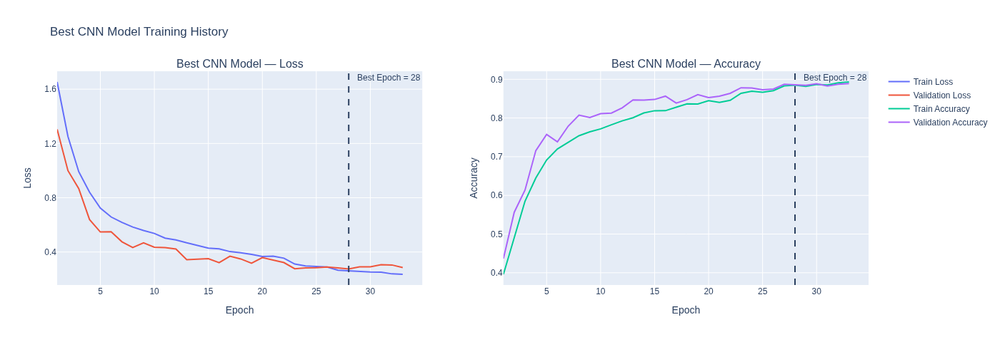

In [99]:
plot_history(hist_compare_1, 'Best CNN Model')

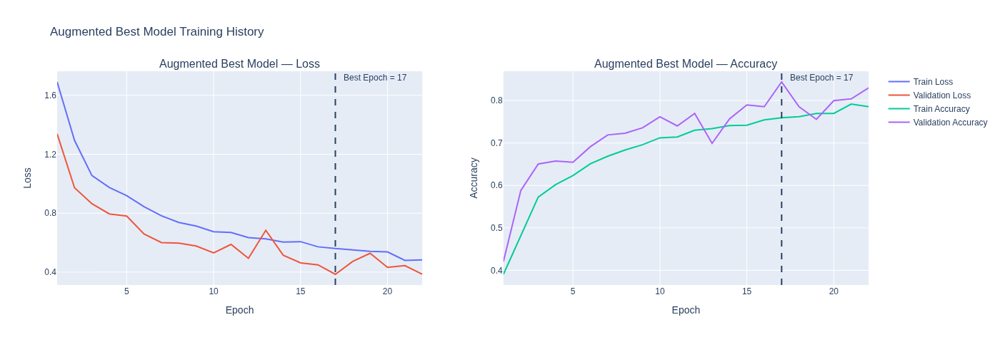

In [100]:
plot_history(history_aug, 'Augmented Best Model')

In [101]:
history_final_2 = {}
history_final_2["modified_cnn"]= histories_cnn['model_cnn_t5']
history_final_2["augmented_m_cnn"] = history_aug


In [102]:
results_final_2 = []
type_map = {
    "modified_cnn": "Modified CNN",
    "augmented_m_cnn": "Augemented Modified CNN"
}
for i, (name, history) in enumerate(history_final_2.items(), start=1):
    hist = history.history

    best_epoch = int(np.argmin(hist["val_loss"]))

    train_acc  = hist["accuracy"][best_epoch]
    val_acc    = hist["val_accuracy"][best_epoch]
    train_loss = hist["loss"][best_epoch]
    val_loss   = hist["val_loss"][best_epoch]

    acc_gap  = train_acc - val_acc
    loss_gap = val_loss - train_loss

    fit_type = fit_group(train_acc, val_acc, train_loss, val_loss)

    results_final_2.append({
        "No": i,
        "Model": type_map.get(name, name),

        "Best Epoch": best_epoch + 1,

        "Train Acc": train_acc,
        "Train Loss": train_loss,
        "Val Acc": val_acc,
        "Val Loss": val_loss,

        "Fit": fit_type,
        "Acc Gap": acc_gap,
        "Loss Gap": loss_gap
    })

In [103]:
models_to_eval_2 = [
    ("Modified CNN", best_cnn, X_test_nn, y_test_nn, False),
    ("Augmented Modified CNN",model_aug,X_test_nn, y_test_nn, False),
]

In [104]:
results_eval_2, metrics_eval_2 = evaluate_models(models_to_eval_2, num_classes)


MODELS PERFORMANCE SUMMARY
Modified CNN
Accuracy: 0.7507
Balanced Accuracy: 0.6972
Micro Precision: 0.7507
Macro Precision: 0.7024
Micro Recall: 0.7507
Macro Recall: 0.6972
Micro F1: 0.7507
Macro F1: 0.6952
Macro AUC: 0.9687
Micro AUC: 0.9779
------------------------------------------------------------
Augmented Modified CNN
Accuracy: 0.7284
Balanced Accuracy: 0.6644
Micro Precision: 0.7284
Macro Precision: 0.6635
Micro Recall: 0.7284
Macro Recall: 0.6644
Micro F1: 0.7284
Macro F1: 0.6288
Macro AUC: 0.9663
Micro AUC: 0.9756
------------------------------------------------------------


In [105]:
df_final_2 = pd.DataFrame(results_final_2)

df_final_2 = df_final_2.style.format({
    col: "{:.4f}" 
    for col in df_final_2.select_dtypes(include="number").columns
}).map(highlight_fit, subset=["Fit"]).apply(highlight_best, subset=["Train Acc","Val Acc"])

df_final_2

,No,Model,Best Epoch,Train Acc,Train Loss,Val Acc,Val Loss,Fit,Acc Gap,Loss Gap
0,1.0000,Modified CNN,28.0000,0.8849,0.2605,0.8858,0.2752,Good fit,-0.0009,0.0147
1,2.0000,Augemented Modified CNN,17.0000,0.7595,0.5598,0.8438,0.3850,Good fit,-0.0843,-0.1749


In [106]:
df_met_2_results =pd.DataFrame(metrics_eval_2)

In [107]:
df_met_2 = df_met_2_results.copy()
metric_cols = df_met_2.select_dtypes(include=['number']).columns
print("\nModels Evaluation Chart")
df_met_2 = (
    df_met_2.style
    .format("{:.4f}")
    .apply(highlight_best_row, axis=1, subset=metric_cols)
)

df_met_2


Models Evaluation Chart


,Modified CNN,Augmented Modified CNN
balanced_accuracy,0.6972,0.6644
accuracy,0.7507,0.7284
micro_recall,0.7507,0.7284
macro_recall,0.6972,0.6644
micro_precision,0.7507,0.7284
macro_precision,0.7024,0.6635
micro_f1,0.7507,0.7284
macro_f1,0.6952,0.6288
macro_auc,0.9687,0.9663
micro_auc,0.9779,0.9756


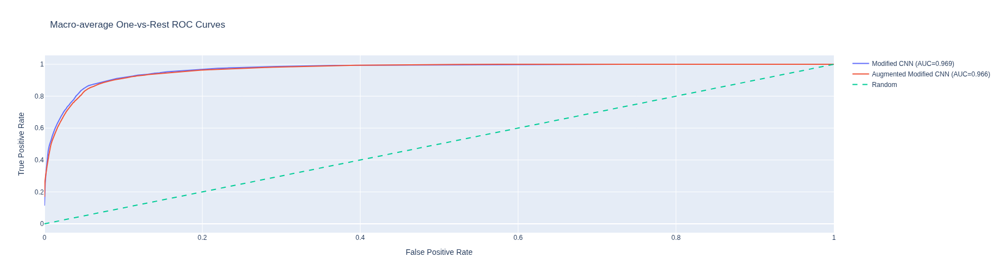

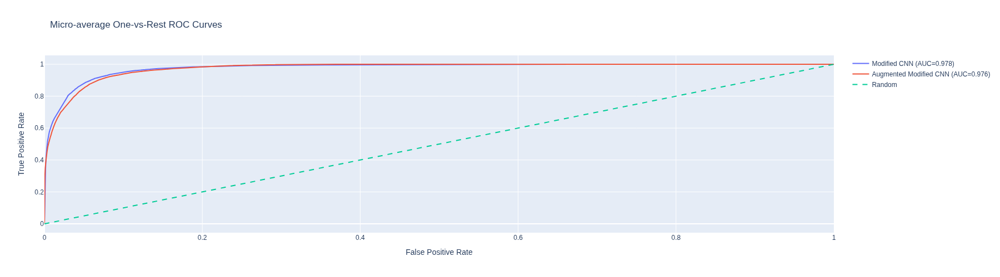

In [108]:
plot_macro_roc(results_eval_2)
plot_micro_roc(results_eval_2)    

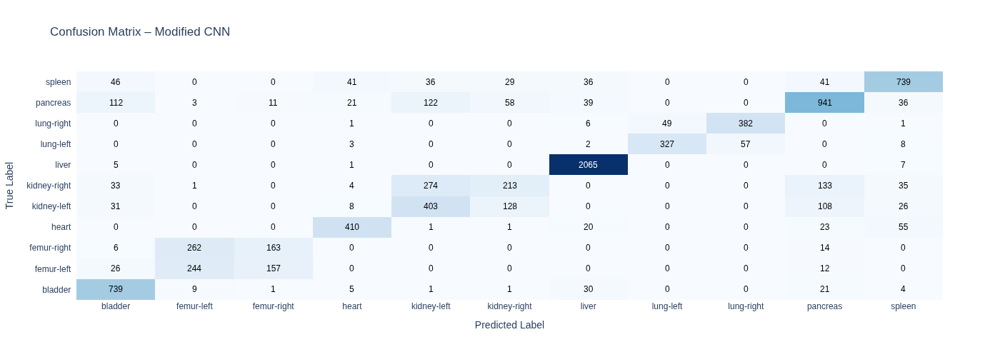

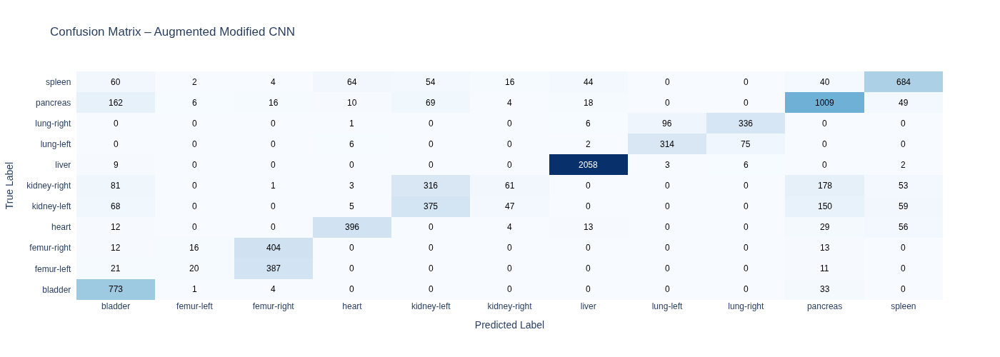

In [109]:
plot_confusion_matrices(results_eval_2, classes=class_label_list)

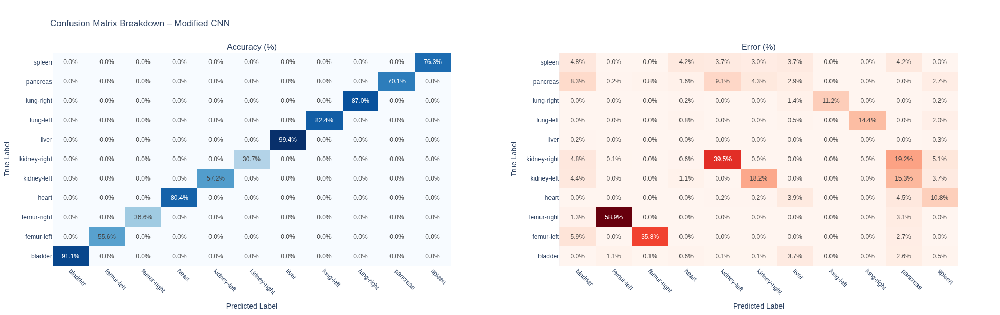

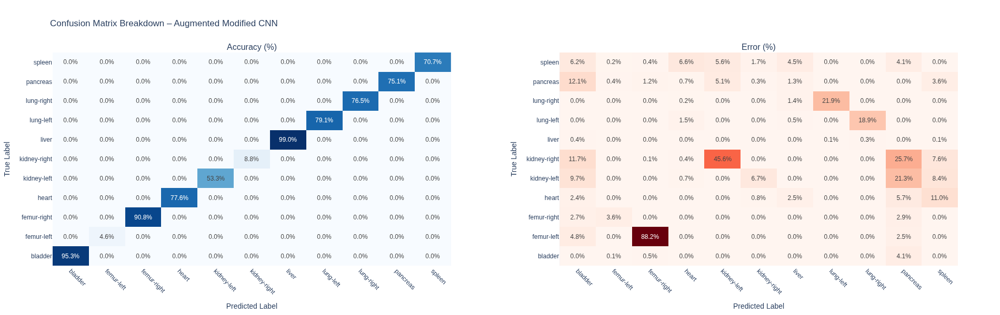

In [110]:
plot_acc_err_cm(results_eval_2, "Modified CNN", class_label_list)
plot_acc_err_cm(results_eval_2, "Augmented Modified CNN", class_label_list)

### Discussion on Aumgmented Best Model vs Non-Augmented Best Model

Applying augmentation to the model_cnn_t5 model did not improve the model's performance, as can be seen from the above metrics [cell 107], accuracy performance was slighly reduced on all metrics and the ROC AUC curve shifted slighly to the right, indicating a slight loss in predictive accuracy.

One possible explanation might be due to the fact that the augmentation created more confusion for the model and further blurring any distinctive characteristics in the images, albeit very slighly, for example, 45.6% of the errors misclassification errors in the <span style="color : Green">kidney-right</span> is attributable to the model misclassifing them as the <span style="color : Green">kidney-left</span> compared to [35.5%] in the baseline un-augmented model. Further, we see a reversal of classification errors in the femur organ class, where 88.2% of the errors in the <span style="color : Green">femur-right</span> class were misclassified as the <span style="color : Green">femur-left</span> as opposed to 35.8% in the un-augmented model and 3.6% of the errors in the <span style="color : Green">femur-left</span> class are attributable to the model misclassifing the image as a <span style="color : Green">femur-right</span> as opposed to 58.9% in the un-augmented model. 
In addition, only 14.42% of the errors in the <span style="color : Green">lung-right</span> images class are attributable to the model classifying them as a <span style="color : Green">lung-left</span> and this is as opposed to 18.9% in the model un-augmented model. 

As indicated above, one possible solution is to further fine tune the model to better recognise and diffrentiate medical images by retraining latter layers of the base model with a variety of both baseline and augmented datasets, in effect, making the model specialize in classifying medical images that we are concerned with.

# References

Abbass, J (2026) Machine learning and Deep Learning lectures.

Abadi, M. et al. (2015) TensorFlow: Large-scale machine learning on heterogeneous systems. Available at: https://www.tensorflow.org.

Hunter, J.D. (2007) ‘Matplotlib: A 2D graphics environment’, Computing in Science & Engineering, 9(3), pp. 90–95.

Plotly Technologies Inc. (2015) Collaborative data science. Available at: https://plot.ly.

Pedregosa, F. et al. (2011) ‘Scikit-learn: Machine learning in Python’, Journal of Machine Learning Research, 12, pp. 2825–2830.